In [1]:
#Import necessary library

import numpy as np
import pandas as pd
import csv
import seaborn as sns
import math
import missingno as msno

import matplotlib.pyplot as plt
from sklearn import datasets


# Read Dataset

In [2]:
#filename_read = "UDP.csv"
df1 = pd.read_csv("UDP.csv",low_memory=False) #read the csv file in df
df2 = pd.read_csv("LDAP.csv",low_memory=False) #read the csv file in df
df3 = pd.read_csv("Portmap.csv",low_memory=False) #read the csv file in df
#df4 = pd.read_csv("NetBIOS.csv",low_memory=False) #read the csv file in df


In [3]:
data_list = [df1, df2, df3]

print('Data dimensions: ')
for i, data in enumerate(data_list, start = 1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')

Data dimensions: 
Data1 -> 3782206 rows, 88 columns
Data2 -> 2113234 rows, 88 columns
Data3 -> 191694 rows, 88 columns


In [4]:
df = pd.concat(data_list)
rows, cols = df.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 6087134
Number of columns: 88
Total cells: 535667792


In [5]:
# Deleting dataframes after concating to save memory
for d in data_list: del d
     

In [6]:
# Renaming the columns by removing leading/trailing whitespace
col_names = {col: col.strip() for col in df.columns}
df.rename(columns = col_names, inplace = True)

In [7]:
df.head()  # read first five rows

,Unnamed: 0,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,...,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,SimillarHTTP,Inbound,Label
0,15798,172.16.0.5-192.168.50.4-9401-15931-17,172.16.0.5,9401,192.168.50.4,15931,17,2018-11-03 10:42:57.176671,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
1,110891,172.16.0.5-192.168.50.4-9402-29997-17,172.16.0.5,9402,192.168.50.4,29997,17,2018-11-03 10:42:57.176673,0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
2,66956,172.16.0.5-192.168.50.4-9403-29887-17,172.16.0.5,9403,192.168.50.4,29887,17,2018-11-03 10:42:57.176727,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
3,66144,172.16.0.5-192.168.50.4-9404-7393-17,172.16.0.5,9404,192.168.50.4,7393,17,2018-11-03 10:42:57.176729,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
4,72903,172.16.0.5-192.168.50.4-9405-57957-17,172.16.0.5,9405,192.168.50.4,57957,17,2018-11-03 10:42:57.177121,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL


In [8]:
df.tail()  #bottom five rows

,Unnamed: 0,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,...,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,SimillarHTTP,Inbound,Label
191689,141421,172.16.0.5-192.168.50.4-855-47131-17,172.16.0.5,855,192.168.50.4,47131,17,2018-11-03 10:01:48.919833,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191690,189763,172.16.0.5-192.168.50.4-856-53617-17,172.16.0.5,856,192.168.50.4,53617,17,2018-11-03 10:01:48.920175,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191691,52484,172.16.0.5-192.168.50.4-857-9612-17,172.16.0.5,857,192.168.50.4,9612,17,2018-11-03 10:01:48.920464,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191692,176631,172.16.0.5-192.168.50.4-858-23408-17,172.16.0.5,858,192.168.50.4,23408,17,2018-11-03 10:01:48.920466,49,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191693,169688,172.16.0.5-192.168.50.4-859-50418-17,172.16.0.5,859,192.168.50.4,50418,17,2018-11-03 10:01:48.920515,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap


# Sanity check of data

In [9]:
# data = pd.concat(data_list)
rows, cols = df.shape   # rows and column count

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 6087134
Number of columns: 88
Total cells: 535667792


In [10]:
df.info()   # information about the datatypes

<class 'pandas.core.frame.DataFrame'>
Index: 6087134 entries, 0 to 191693
Data columns (total 88 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Unnamed: 0                   int64  
 1   Flow ID                      object 
 2   Source IP                    object 
 3   Source Port                  int64  
 4   Destination IP               object 
 5   Destination Port             int64  
 6   Protocol                     int64  
 7   Timestamp                    object 
 8   Flow Duration                int64  
 9   Total Fwd Packets            int64  
 10  Total Backward Packets       int64  
 11  Total Length of Fwd Packets  float64
 12  Total Length of Bwd Packets  float64
 13  Fwd Packet Length Max        float64
 14  Fwd Packet Length Min        float64
 15  Fwd Packet Length Mean       float64
 16  Fwd Packet Length Std        float64
 17  Bwd Packet Length Max        float64
 18  Bwd Packet Length Min        float64
 19  Bwd Pa

In [11]:
#finding missing value
df.isnull().sum()

Unnamed: 0        0
Flow ID           0
Source IP         0
Source Port       0
Destination IP    0
                 ..
Idle Max          0
Idle Min          0
SimillarHTTP      0
Inbound           0
Label             0
Length: 88, dtype: int64

In [12]:
#finding percentage of missing value
df.isnull().sum()/df.shape[0]*100

Unnamed: 0        0.0
Flow ID           0.0
Source IP         0.0
Source Port       0.0
Destination IP    0.0
                 ... 
Idle Max          0.0
Idle Min          0.0
SimillarHTTP      0.0
Inbound           0.0
Label             0.0
Length: 88, dtype: float64

In [13]:
#finding duplicate value
df.duplicated().sum()

0

In [14]:
df = df.drop_duplicates() # dropping all duplicate rows

df

,Unnamed: 0,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,...,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,SimillarHTTP,Inbound,Label
0,15798,172.16.0.5-192.168.50.4-9401-15931-17,172.16.0.5,9401,192.168.50.4,15931,17,2018-11-03 10:42:57.176671,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
1,110891,172.16.0.5-192.168.50.4-9402-29997-17,172.16.0.5,9402,192.168.50.4,29997,17,2018-11-03 10:42:57.176673,0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
2,66956,172.16.0.5-192.168.50.4-9403-29887-17,172.16.0.5,9403,192.168.50.4,29887,17,2018-11-03 10:42:57.176727,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
3,66144,172.16.0.5-192.168.50.4-9404-7393-17,172.16.0.5,9404,192.168.50.4,7393,17,2018-11-03 10:42:57.176729,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
4,72903,172.16.0.5-192.168.50.4-9405-57957-17,172.16.0.5,9405,192.168.50.4,57957,17,2018-11-03 10:42:57.177121,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,MSSQL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191689,141421,172.16.0.5-192.168.50.4-855-47131-17,172.16.0.5,855,192.168.50.4,47131,17,2018-11-03 10:01:48.919833,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191690,189763,172.16.0.5-192.168.50.4-856-53617-17,172.16.0.5,856,192.168.50.4,53617,17,2018-11-03 10:01:48.920175,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191691,52484,172.16.0.5-192.168.50.4-857-9612-17,172.16.0.5,857,192.168.50.4,9612,17,2018-11-03 10:01:48.920464,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap
191692,176631,172.16.0.5-192.168.50.4-858-23408-17,172.16.0.5,858,192.168.50.4,23408,17,2018-11-03 10:01:48.920466,49,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,Portmap


In [15]:
#identify garbage value (if there is garbage value it is in form of object)

for i in df.select_dtypes(include="object").columns:
  print(df[i].value_counts())
  print("***"*10)

Flow ID
172.16.0.5-192.168.50.4-0-0-0             119
192.168.50.254-224.0.0.5-0-0-0            113
192.168.50.253-224.0.0.5-0-0-0            113
8.0.6.4-8.6.0.1-0-0-0                      55
192.168.50.9-4.2.2.4-42207-53-17           40
                                         ... 
172.16.0.5-192.168.50.4-36957-23783-17      1
172.16.0.5-192.168.50.4-60433-60269-17      1
172.16.0.5-192.168.50.4-48703-14347-17      1
172.16.0.5-192.168.50.4-58783-13392-17      1
172.16.0.5-192.168.50.4-859-50418-17        1
Name: count, Length: 5766248, dtype: int64
******************************
Source IP
172.16.0.5       6071983
192.168.50.6        4161
192.168.50.8        3351
192.168.50.9        2684
192.168.50.4        2235
                  ...   
52.207.84.241          1
52.202.33.220          1
54.156.204.70          1
34.239.68.84           1
172.217.9.242          1
Name: count, Length: 427, dtype: int64
******************************
Destination IP
192.168.50.4      6072000
4.2.2.4         

In [16]:
df.columns

Index(['Unnamed: 0', 'Flow ID', 'Source IP', 'Source Port', 'Destination IP',
       'Destination Port', 'Protocol', 'Timestamp', 'Flow Duration',
       'Total Fwd Packets', 'Total Backward Packets',
       'Total Length of Fwd Packets', 'Total Length of Bwd Packets',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags',
       'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Le

In [17]:
#descriptive statistics
df.describe().T  #T is transpose

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,6087134.0,51270.127029,4.139379e+04,0.0,17292.25,35723.0,83279.0,2.128330e+05
Source Port,6087134.0,29456.052984,2.328301e+04,0.0,889.00,38320.0,49720.0,6.553300e+04
Destination Port,6087134.0,33077.591351,1.878214e+04,0.0,16863.00,33084.0,49364.0,6.553500e+04
Protocol,6087134.0,16.980883,4.654817e-01,0.0,17.00,17.0,17.0,1.700000e+01
Flow Duration,6087134.0,73741.231420,1.433031e+06,0.0,1.00,1.0,106430.0,1.199956e+08
...,...,...,...,...,...,...,...,...
Idle Mean,6087134.0,7741.996196,5.897165e+05,0.0,0.00,0.0,0.0,1.157254e+08
Idle Std,6087134.0,464.849662,9.573596e+04,0.0,0.00,0.0,0.0,6.188006e+07
Idle Max,6087134.0,8188.244030,6.181154e+05,0.0,0.00,0.0,0.0,1.157254e+08
Idle Min,6087134.0,7339.532931,5.746876e+05,0.0,0.00,0.0,0.0,1.157254e+08


In [18]:
df.describe(include ="object")

,Flow ID,Source IP,Destination IP,Timestamp,SimillarHTTP,Label
count,6087134,6087134,6087134,6087134,6087134,6087134
unique,5766248,427,458,6086780,106,6
top,172.16.0.5-192.168.50.4-0-0-0,172.16.0.5,192.168.50.4,2018-11-03 10:56:08.843357,0,UDP
freq,119,6071983,6072000,2,6086771,3754680


In [19]:
# Compute the correlation matrix for numerical columns
s=df.select_dtypes(include="number").corr()

<Axes: >

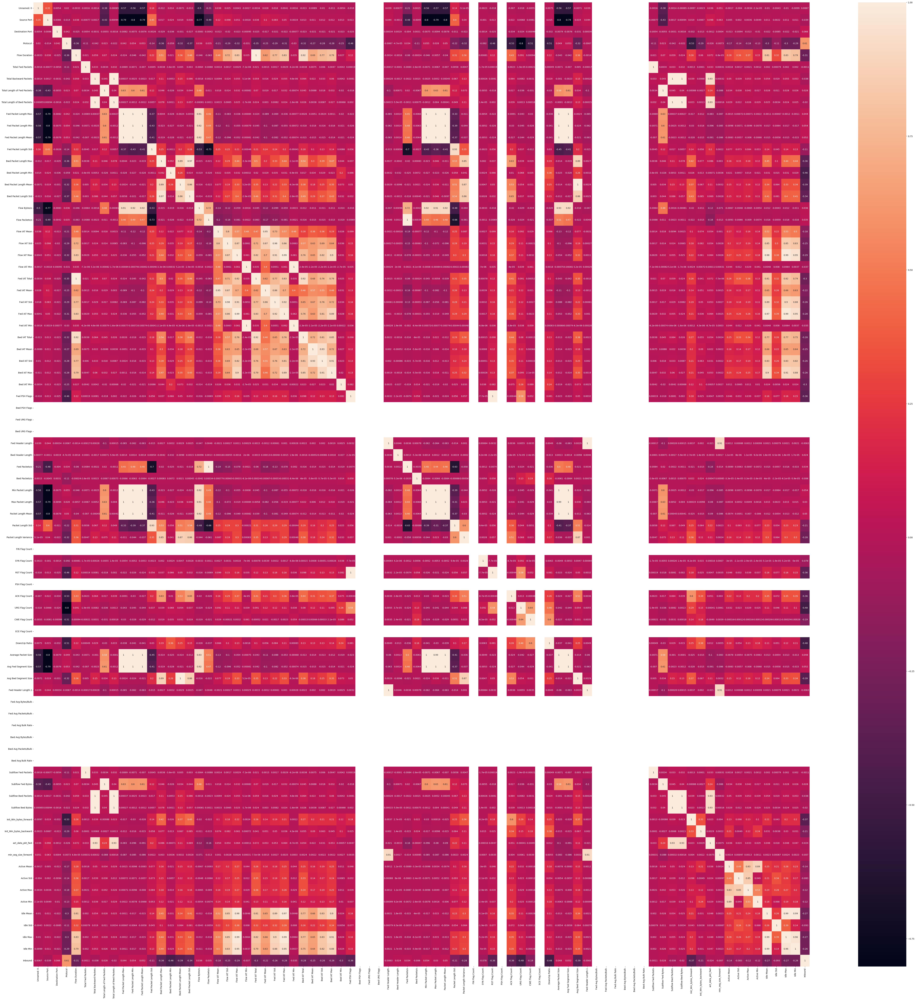

In [20]:
plt.figure(figsize = (80,80))
sns.heatmap(s,annot=True)

In [21]:
# Checking for infinity values
# Select numeric columns
numeric_cols = df.select_dtypes(include = np.number).columns

# Check for infinity values and count them
inf_count = np.isinf(df[numeric_cols]).sum()

print(inf_count[inf_count > 0])

Flow Bytes/s      140941
Flow Packets/s    140959
dtype: int64


In [22]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {df.isna().sum().sum()}')

df.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {df.isna().sum().sum()}')

Initial missing values: 18
Missing values after processing infinite values: 281918


In [23]:
missing = df.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s      140959
Flow Packets/s    140959
dtype: int64


In [24]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(df)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s            140959                        2.32
Flow Packets/s          140959                        2.32


Visualisation of missing data


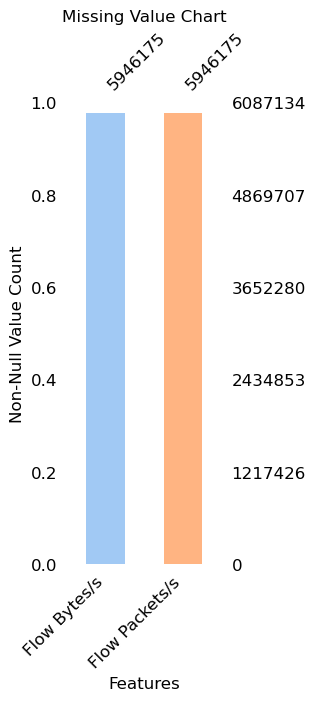

In [25]:
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in df.columns if df[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(df[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

Dealing with missing values (Columns with missing data)

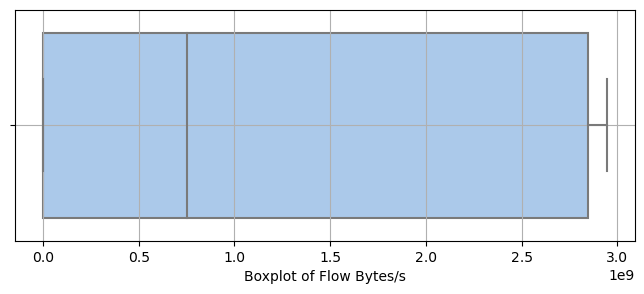

In [26]:
plt.figure(figsize = (8, 3))
sns.boxplot(x = df['Flow Bytes/s'])
plt.xlabel('Boxplot of Flow Bytes/s')
plt.grid()
plt.show()
     

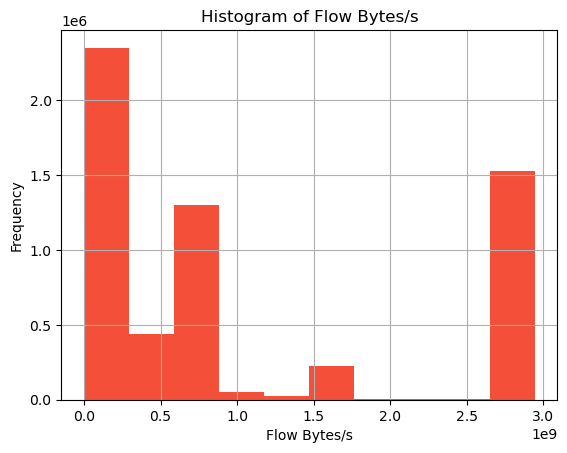

In [27]:
colors = sns.color_palette('Reds')
plt.hist(df['Flow Bytes/s'], color = colors[3])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.grid()
plt.show()

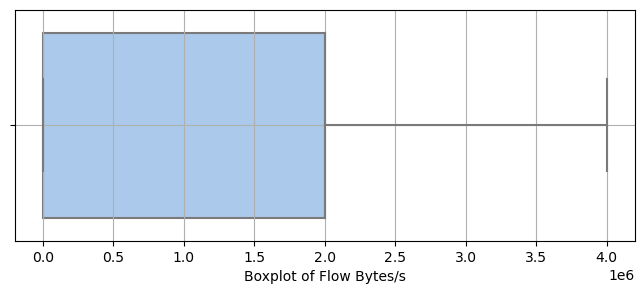

In [28]:
plt.figure(figsize = (8, 3))
sns.boxplot(x = df['Flow Packets/s'])
plt.xlabel('Boxplot of Flow Bytes/s')
plt.grid()
plt.show()
     

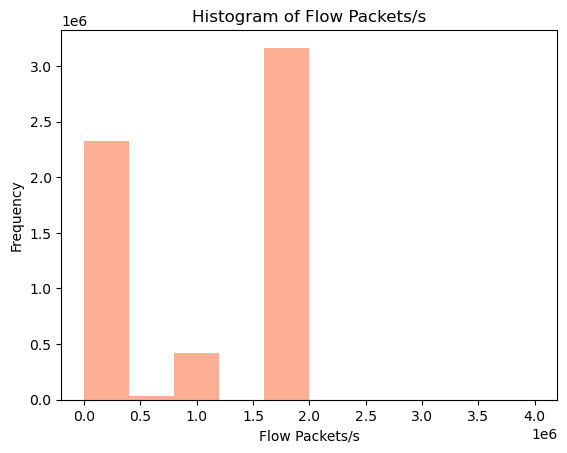

In [29]:
colors = sns.color_palette('Reds')
plt.hist(df['Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()

In [30]:
med_flow_bytes = df['Flow Bytes/s'].median()
med_flow_packets = df['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

Median of Flow Bytes/s:  750000000.0
Median of Flow Packets/s:  2000000.0


In [31]:
# Filling missing values with median
df['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
df['Flow Packets/s'].fillna(med_flow_packets, inplace = True)

print('Number of \'Flow Bytes/s\' missing values:', df['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', df['Flow Packets/s'].isna().sum())

Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


In [32]:
df['Label'].unique()

array(['MSSQL', 'BENIGN', 'UDP', 'NetBIOS', 'LDAP', 'Portmap'],
      dtype=object)

In [33]:
# Types of attacks & normal instances (BENIGN)
df['Label'].value_counts()

Label
UDP        3754680
LDAP       1905191
NetBIOS     202919
Portmap     186960
MSSQL        24392
BENIGN       12992
Name: count, dtype: int64

In [34]:
# Creating a dictionary that maps each label to its attack type
attack_map = {'UDP':'UDP', 'MSSQL': 'MSSQL','BENIGN': 'BENIGN', 'NetBIOS' :'NetBIOS','LDAP':'LDAP','Portmap':'Portmap' }

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
df['Attack Type'] = df['Label'].map(attack_map)
     

In [35]:
df['Attack Type'].value_counts()

Attack Type
UDP        3754680
LDAP       1905191
NetBIOS     202919
Portmap     186960
MSSQL        24392
BENIGN       12992
Name: count, dtype: int64

In [36]:
df.drop('Label', axis = 1, inplace = True)


# Encoding 
Most estimators for classification in scikit-learn convert class labels to integers internally, it is considered good practice to provide class labels as integer arrays to avoid technical glitches (Text book 1: Python Machine Learning, 3rd Ed, Raschka, Sebastian and Mirjalili, Vahid )

In [37]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['Attack Number'] = le.fit_transform(df['Attack Type'])

print(df['Attack Number'].unique())

[2 0 5 3 1 4]


In [38]:
# Printing corresponding attack type for each encoded value
encoded_values = df['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")
     

0: BENIGN
1: LDAP
2: MSSQL
3: NetBIOS
4: Portmap
5: UDP


In [39]:
corr = df.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

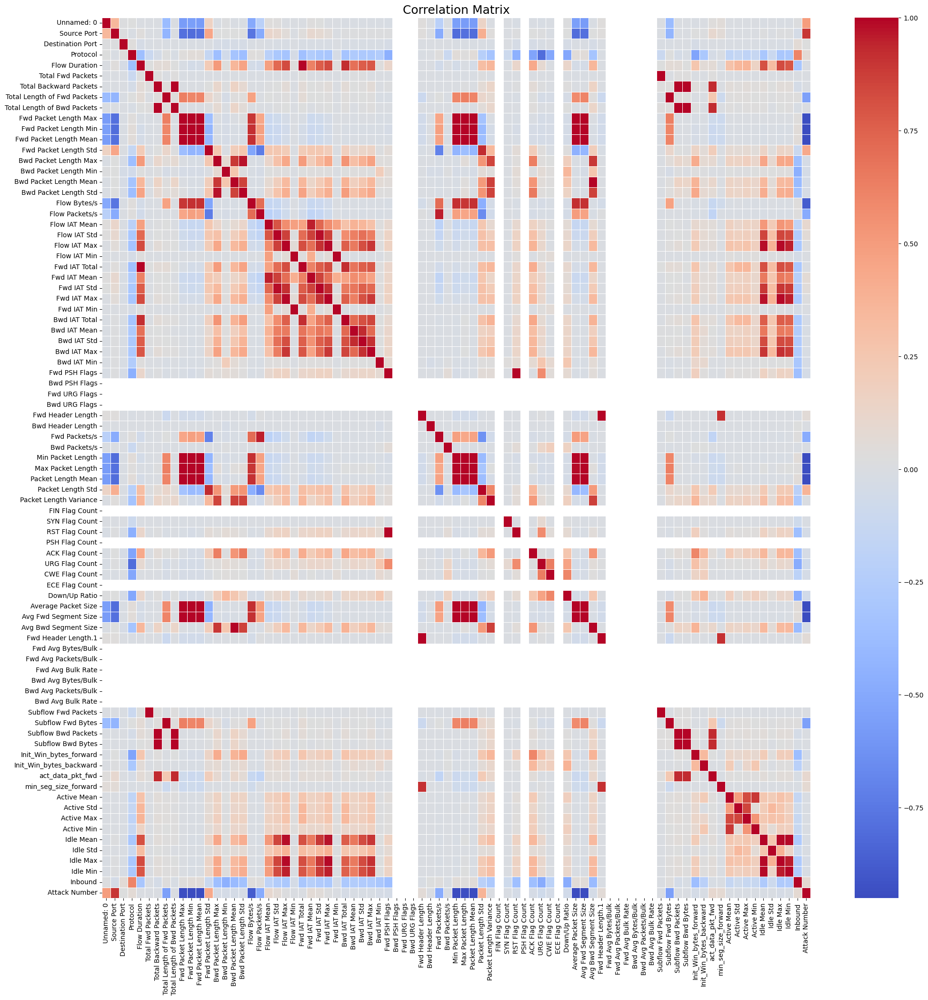

In [40]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

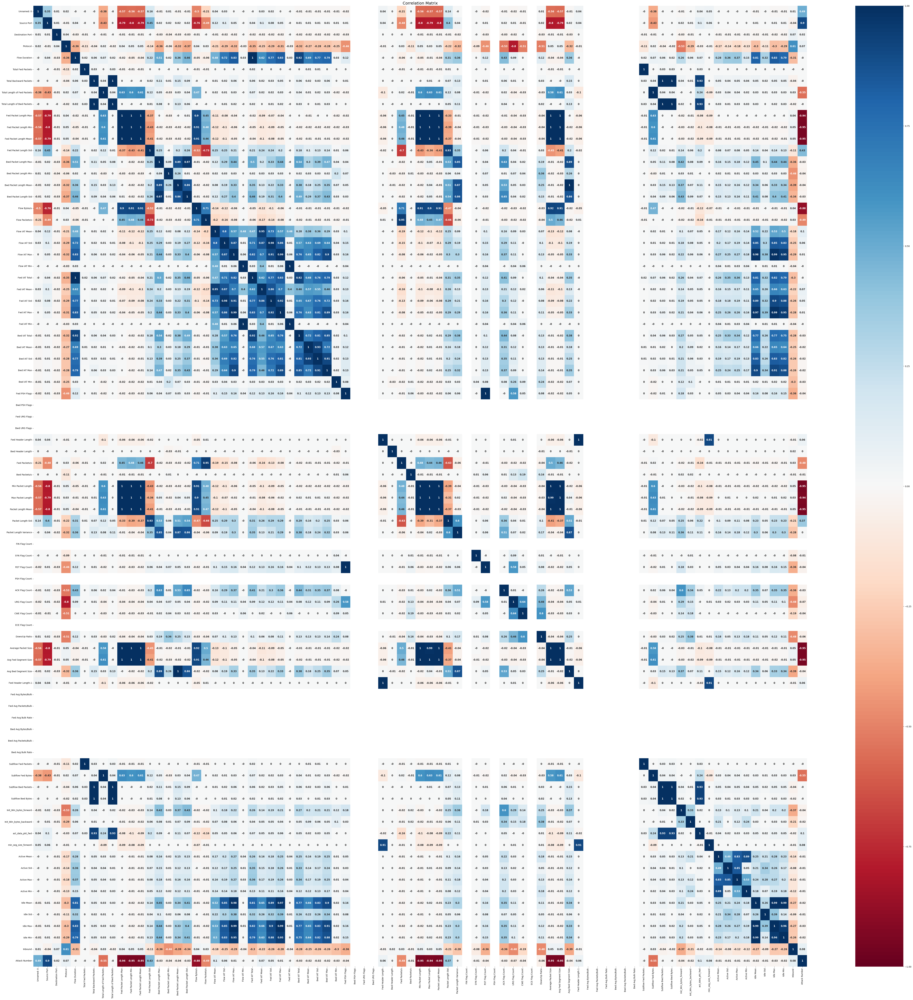

In [41]:
fig, ax = plt.subplots(figsize = (80, 80))
sns.heatmap(corr, cmap = 'RdBu', annot = True, vmin = -1, vmax = 1, annot_kws={'fontsize': 11, 'fontweight' : 'bold'})
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [42]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Unnamed: 0               :0.49
2.  Source Port              :0.9
3.  Destination Port         :0.02
4.  Protocol                 :0.07
5.  Fwd Packet Length Std    :0.43
6.  Flow IAT Mean            :0.1
7.  Flow IAT Std             :0.06
8.  Flow IAT Max             :0.01
9.  Fwd IAT Mean             :0.07
10. Fwd IAT Std              :0.05
11. Fwd IAT Max              :0.01
12. Fwd Header Length        :0.06
13. Packet Length Std        :0.37
14. Fwd Header Length.1      :0.06
15. act_data_pkt_fwd         :0.1
16. min_seg_size_forward     :0.08
17. Inbound                  :0.08


In [43]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 17


In [44]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)

# Calculate the standard deviation for each numeric column
std = df.std(numeric_only = True)

# Identify columns with zero standard deviation
zero_std_cols = std[std == 0].index.tolist()


zero_std_cols

['Bwd PSH Flags',
 'Fwd URG Flags',
 'Bwd URG Flags',
 'FIN Flag Count',
 'PSH Flag Count',
 'ECE Flag Count',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

# Visualization of Linear Relationships of columns (Continuous Numerical Variables)

In [45]:
# Data sampling for data analysis
sample_size = int(0.2 * len(df)) # 20% of the original size
sampled_data = df.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(1217426, 89)

In [46]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = df.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = df[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))
     

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Unnamed: 0                      51270.127029          51294.024551          0.05%
Source Port                     29456.052984          29480.652800          0.08%
Destination Port                33077.591351          33075.333722          0.01%
Protocol                        16.980883             16.980169             0.00%
Flow Duration                   73741.231420          76034.624914          3.11%
Total Fwd Packets               3.902678              4.027265              3.19%
Total Backward Packets          0.024466              0.022937              6.25%
Total Length of Fwd Packets     1794.707981           1794.670909           0.00%
Total Length of Bwd Packets     22.225880             16.194105             27.14%
Fwd Packet Length Max   

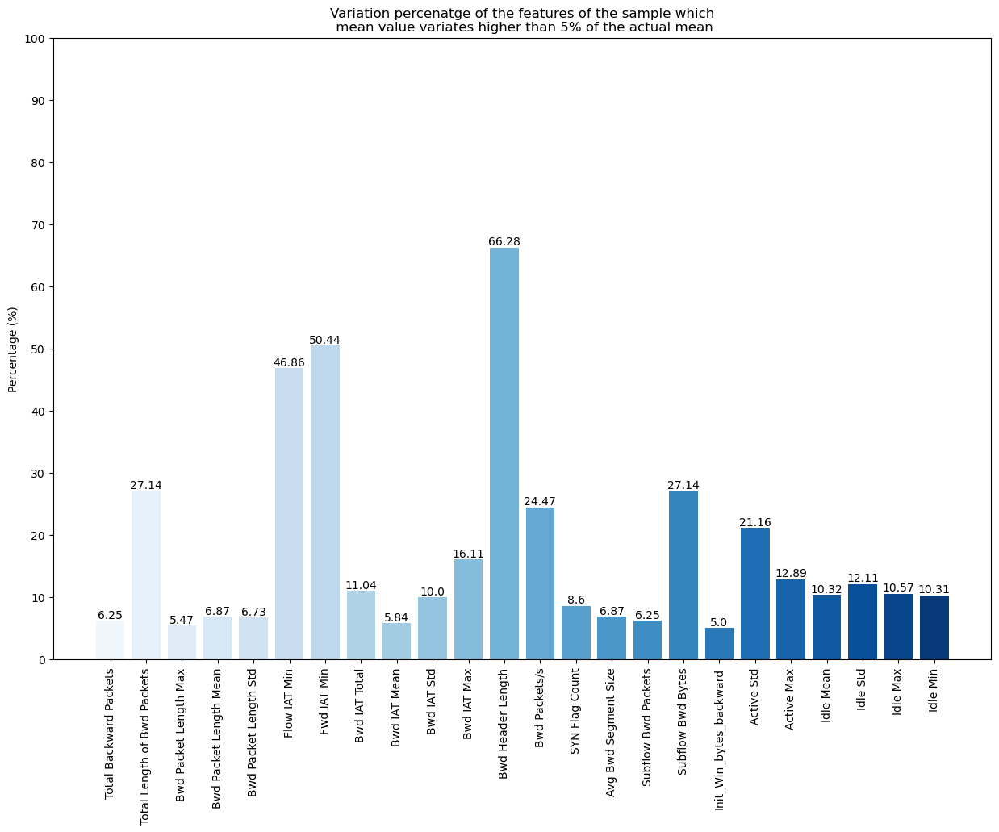

In [47]:
# Labels and values for features with high variation
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

#A blue color palette is selected with the number of colors equal to the number of labels.
colors = sns.color_palette('Blues', n_colors=len(labels))


fig, ax = plt.subplots(figsize = (15, 10))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 101, 10)) #Set y-axis ticks from 0 to 100 with a step of 10.
plt.show()

In [48]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')

#The for loop iterates through the list of column names in sampled_data, excluding the last column ([:-1]).
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Unnamed: 0                    : 157156
2.  Flow ID                       : 1197259
3.  Source IP                     : 198
4.  Source Port                   : 33737
5.  Destination IP                : 326
6.  Destination Port              : 65527
7.  Protocol                      : 3
8.  Timestamp                     : 1217410
9.  Flow Duration                 : 44752
10. Total Fwd Packets             : 117
11. Total Backward Packets        : 112
12. Total Length of Fwd Packets   : 1323
13. Total Length of Bwd Packets   : 492
14. Fwd Packet Length Max         : 752
15. Fwd Packet Length Min         : 628
16. Fwd Packet Length Mean        : 1467
17. Fwd Packet Length Std         : 755
18. Bwd Packet Length Max         : 241
19. Bwd Packet Length Min         : 111
20. Bwd Packet Length Mean        : 523
21. Bwd Packet Length Std         : 427
22. Flow Bytes/s                  : 67294
23. Flow Packets/s                : 45886
24. Flow IAT Mean                 

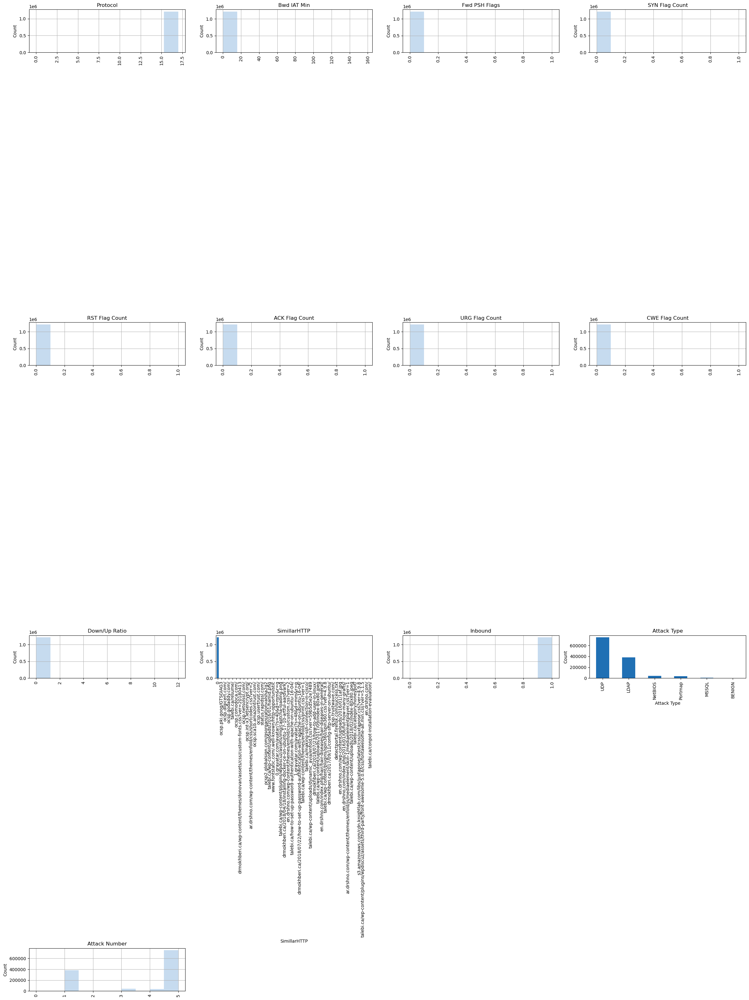

In [49]:
'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''

# Calculate number of unique values for each column
unique_values = sampled_data.nunique()

# Select columns with more than 1 and less than 50 unique values
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)

#Calculates the number of rows needed for subplots based on the number of selected columns (cols).
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

In [50]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

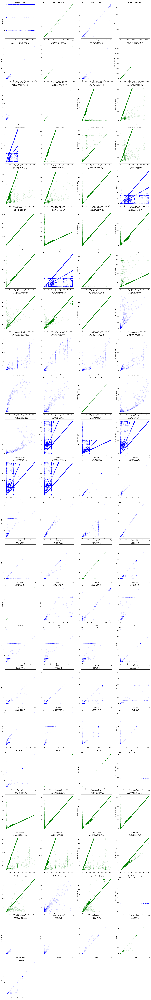

In [51]:
# List of numeric columns
numeric_cols = sampled_data.select_dtypes(include=[np.number]).columns.tolist()

#An empty list high_corr_pairs is initialized to store pairs of columns with high correlation, 
#corr_th is set to 0.85 as the correlation threshold.
high_corr_pairs = []
corr_th = 0.85

# Find pairs of columns with a correlation coefficient of 0.85 or higher
for i in range(len(numeric_cols)):
    for j in range(i + 1, len(numeric_cols)):
        val = sampled_data[numeric_cols[i]].corr(sampled_data[numeric_cols[j]])
        # If the correlation coefficient is NaN or below the threshold, skip to the next pair
        if np.isnan(val) or val < corr_th:
            continue
        high_corr_pairs.append((val, numeric_cols[i], numeric_cols[j]))

# Calculate the number of rows and columns for the subplots
size = len(high_corr_pairs)
cols = 4  # Number of columns for the subplots
rows = size // cols + (1 if size % cols else 0)

fig, axs = plt.subplots(rows, cols, figsize=(24, int(size * 1.7)))

for i in range(rows):
    for j in range(cols):
        index = i * cols + j
        if index >= size:
            fig.delaxes(axs[i, j])
            continue
        val, x, y = high_corr_pairs[index]
        if val > 0.99:
            axs[i, j].scatter(sampled_data[x], sampled_data[y], color='green', alpha=0.1)
        else:
            axs[i, j].scatter(sampled_data[x], sampled_data[y], color='blue', alpha=0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')

fig.tight_layout()
plt.show()


In [52]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
df.drop('Attack Number', axis = 1, inplace = True)

In [53]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                  Outlier Count  Outlier Percentage
Unnamed: 0                 7975                0.66
Source Port                   0                0.00
Destination Port              0                0.00
Protocol                   2143                0.18
Flow Duration             14386                1.18
...                         ...                 ...
Idle Mean                   390                0.03
Idle Std                    252                0.02
Idle Max                    390                0.03
Idle Min                    390                0.03
Inbound                    2606                0.21

[82 rows x 2 columns]


In [54]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Unnamed: 0
- Portmap: 0 (0.00%)
- UDP: 0 (0.00%)
- NetBIOS: 0 (0.00%)
- LDAP: 1085 (0.28%)
- MSSQL: 0 (0.00%)
- BENIGN: 50 (1.87%)

Feature: Source Port
- Portmap: 229 (0.61%)
- UDP: 265 (0.04%)
- NetBIOS: 9 (0.02%)
- LDAP: 233 (0.06%)
- MSSQL: 1172 (23.50%)
- BENIGN: 558 (20.88%)

Feature: Destination Port
- Portmap: 0 (0.00%)
- UDP: 0 (0.00%)
- NetBIOS: 0 (0.00%)
- LDAP: 0 (0.00%)
- MSSQL: 0 (0.00%)
- BENIGN: 488 (18.26%)

Feature: Protocol
- Portmap: 118 (0.32%)
- UDP: 25 (0.00%)
- NetBIOS: 7 (0.02%)
- LDAP: 39 (0.01%)
- MSSQL: 24 (0.48%)
- BENIGN: 0 (0.00%)

Feature: Flow Duration
- Portmap: 9291 (24.88%)
- UDP: 13636 (1.82%)
- NetBIOS: 11893 (29.43%)
- LDAP: 71215 (18.70%)
- MSSQL: 456 (9.14%)
- BENIGN: 575 (21.52%)

Feature: Total Fwd Packets
- Portmap: 85 (0.23%)
- UDP: 20339 (2.71%)
- NetBIOS: 42 (0.10%)
- LDAP: 446 (0.12%)
- MSSQL: 32 (0.64%)
- BENIGN: 478 (17.89%)

Feature: Total Backward Packets
- Portmap: 114 (0.31%)
- UDP: 23 (0.00%)
- NetBIOS: 7 (0.02%)
- LDAP: 3

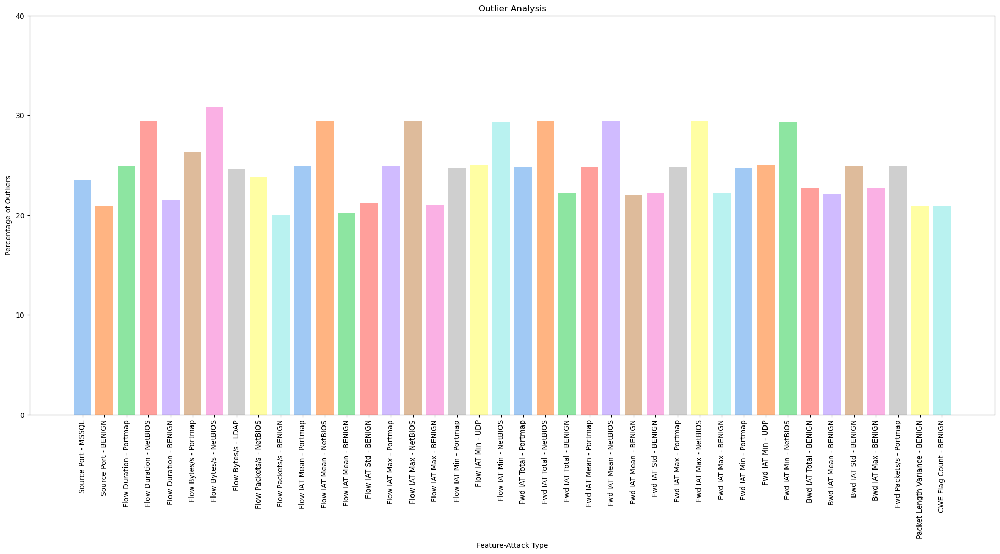

In [55]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

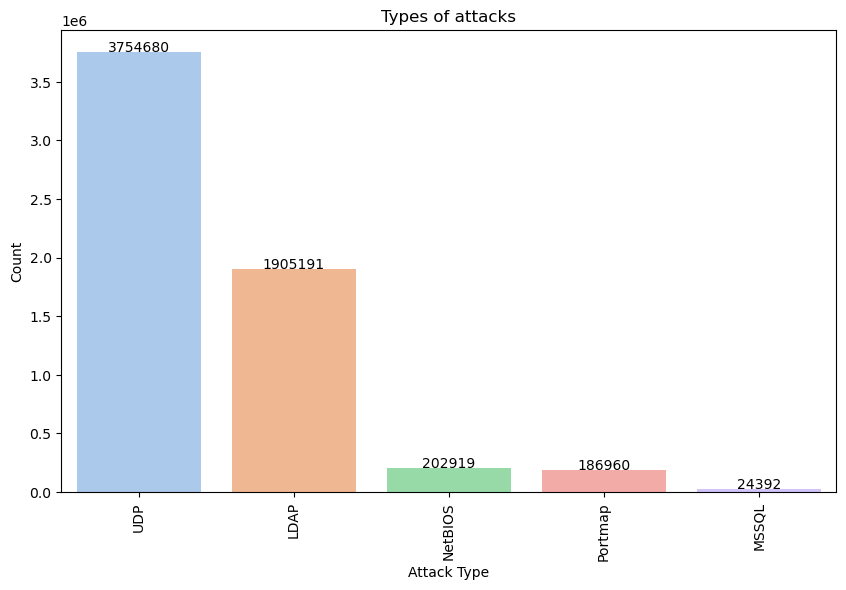

In [56]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = df.loc[df['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

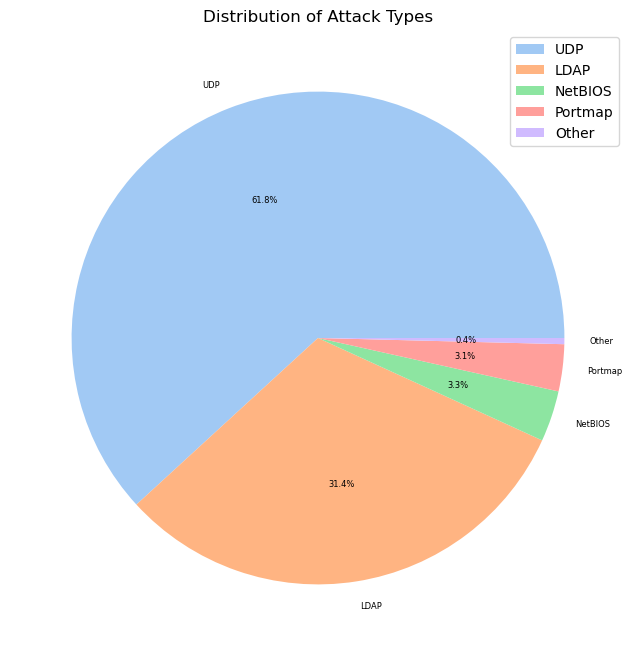

In [57]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()
     

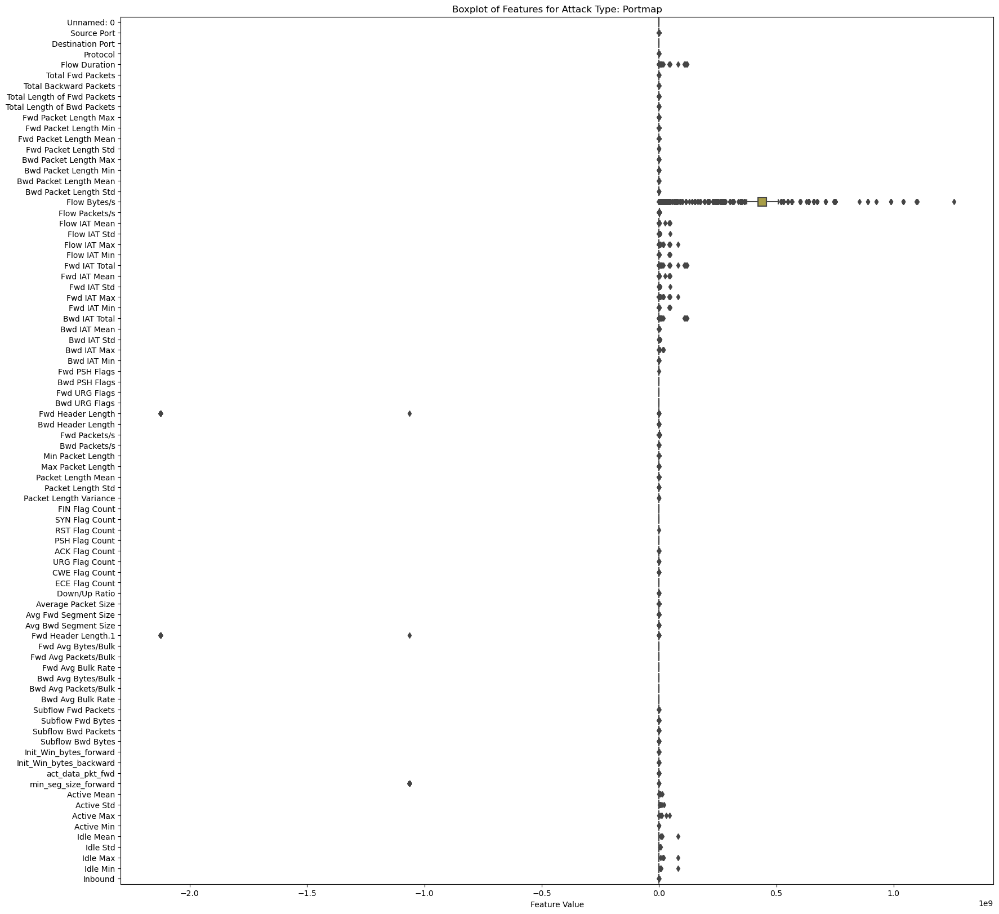

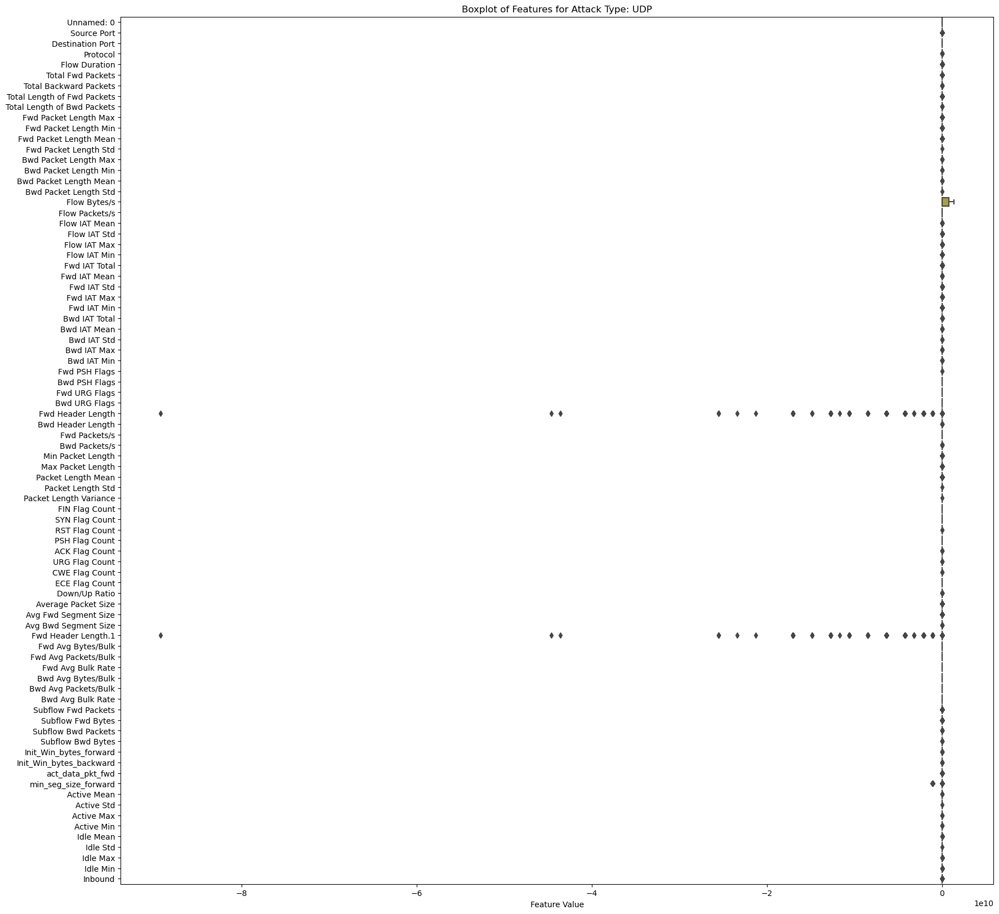

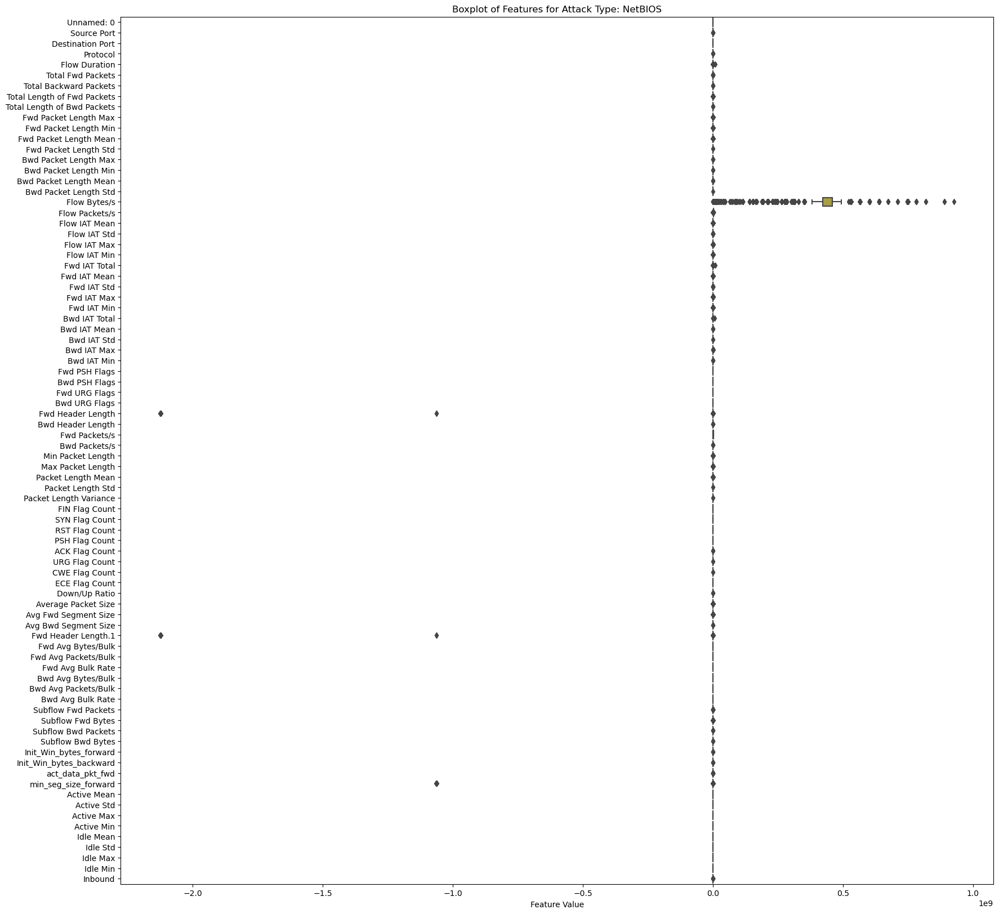

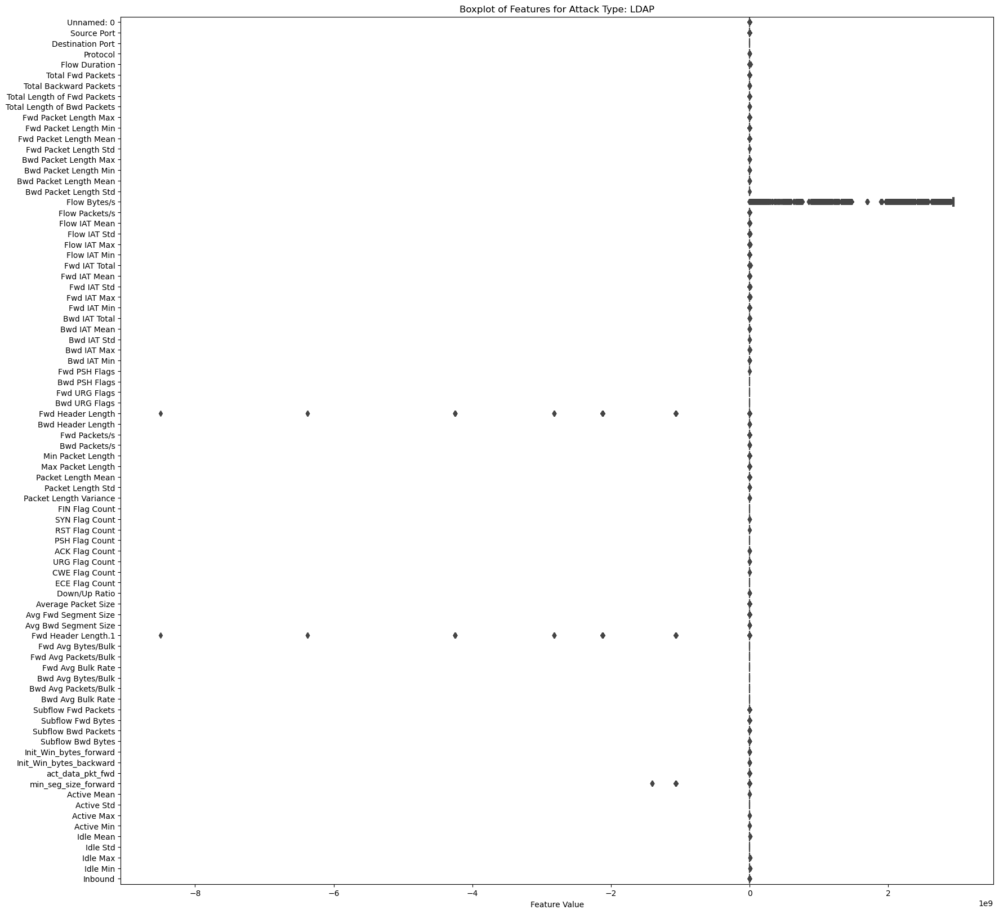

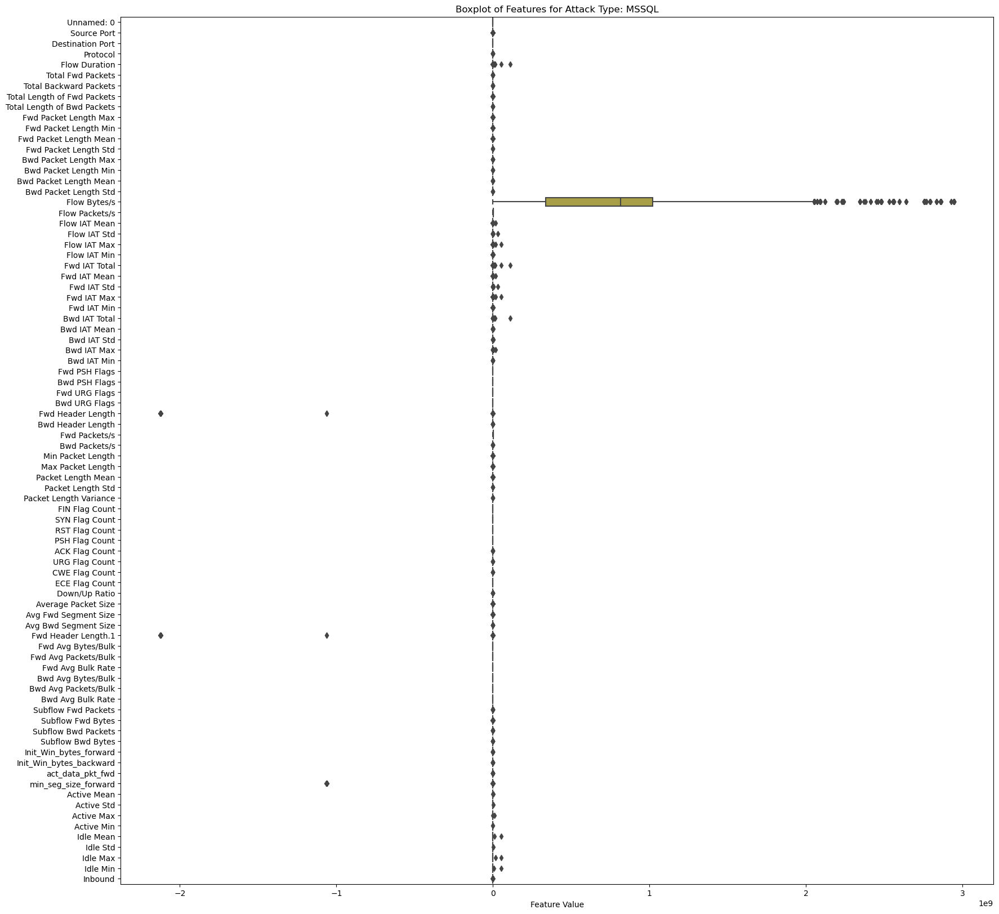

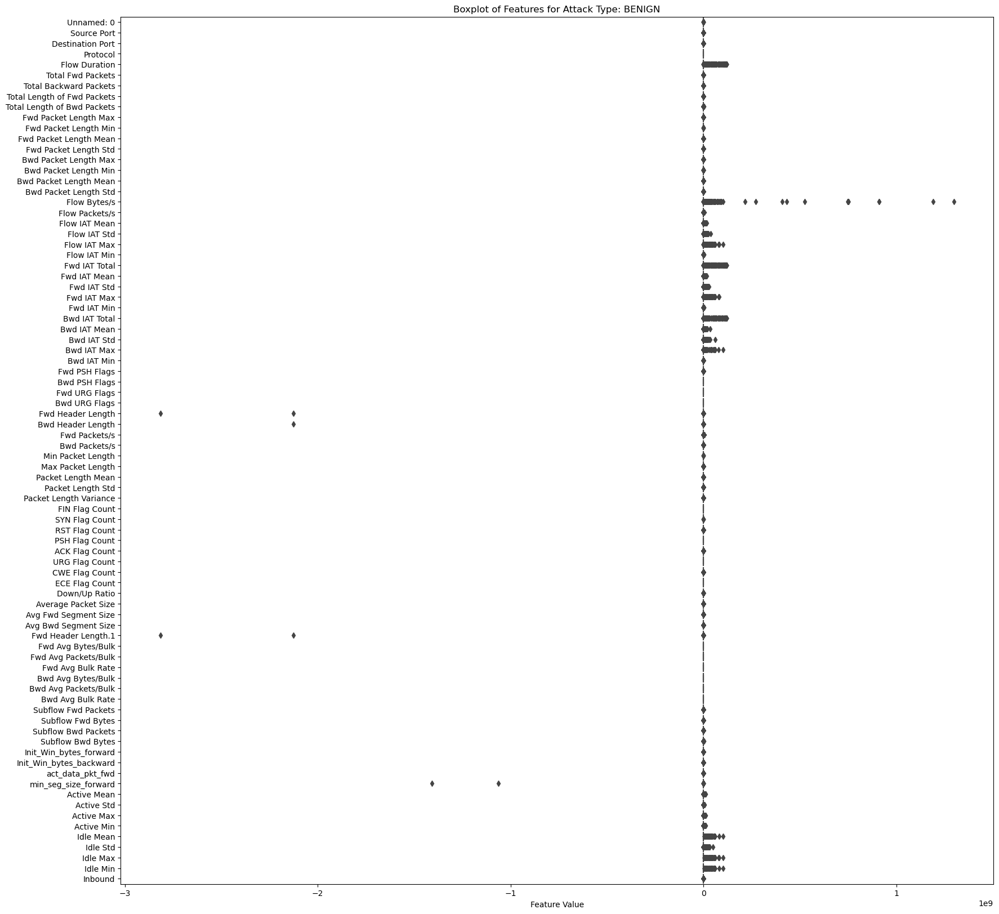

In [58]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()

In [59]:
df.groupby('Attack Type').first()

,Unnamed: 0,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,SimillarHTTP,Inbound
Attack Type,,,,,,,,,,,,,,,,,,,,,
BENIGN,41741,192.168.10.50-192.168.50.8-21-60319-6,192.168.50.8,60319,192.168.10.50,21,6,2018-11-03 10:42:57.648027,9015834,6,...,3009701.0,0.000000e+00,3009701.0,3009701.0,6006131.0,0.000000e+00,6006131.0,6006131.0,0,1
LDAP,127779,172.16.0.5-192.168.50.4-57177-19971-6,172.16.0.5,57177,192.168.50.4,19971,6,2018-11-03 10:19:10.280344,188912,4,...,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0,1
MSSQL,15798,172.16.0.5-192.168.50.4-9401-15931-17,172.16.0.5,9401,192.168.50.4,15931,17,2018-11-03 10:42:57.176671,1,2,...,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0,1
NetBIOS,13605,172.16.0.5-192.168.50.4-870-2908-17,172.16.0.5,870,192.168.50.4,2908,17,2018-11-03 10:09:00.565557,1,2,...,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0,1
Portmap,25,172.16.0.5-192.168.50.4-0-0-0,172.16.0.5,0,192.168.50.4,0,0,2018-11-03 09:18:19.155867,118365715,40,...,2148794.1,3.462641e+06,7515650.0,103.0,9687762.7,5.445120e+06,18391321.0,5118819.0,0,1
UDP,83785,172.16.0.5-192.168.50.4-27799-14566-17,172.16.0.5,27799,192.168.50.4,14566,17,2018-11-03 10:52:00.076641,3,2,...,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0,1


In [60]:
# For improving performance and reduce memory-related errors
old_memory_usage = df.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in df.columns:
    col_type = df[col].dtype
    if col_type != object:
        c_min = df[col].min()
        c_max = df[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            df[col] = df[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            df[col] = df[col].astype(np.int32)

new_memory_usage = df.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 4133.26 MB
Final memory usage: 2298.84 MB


In [61]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 44.38%


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6087134 entries, 0 to 191693
Data columns (total 88 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Unnamed: 0                   int32  
 1   Flow ID                      object 
 2   Source IP                    object 
 3   Source Port                  int32  
 4   Destination IP               object 
 5   Destination Port             int32  
 6   Protocol                     int32  
 7   Timestamp                    object 
 8   Flow Duration                int32  
 9   Total Fwd Packets            int32  
 10  Total Backward Packets       int32  
 11  Total Length of Fwd Packets  float32
 12  Total Length of Bwd Packets  float32
 13  Fwd Packet Length Max        float32
 14  Fwd Packet Length Min        float32
 15  Fwd Packet Length Mean       float32
 16  Fwd Packet Length Std        float32
 17  Bwd Packet Length Max        float32
 18  Bwd Packet Length Min        float32
 19  Bwd Pa

In [63]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,6087134.0,51270.127029,4.139379e+04,0.0,17292.25,35723.0,83279.0,212833.0
Source Port,6087134.0,29456.052984,2.328301e+04,0.0,889.00,38320.0,49720.0,65533.0
Destination Port,6087134.0,33077.591351,1.878214e+04,0.0,16863.00,33084.0,49364.0,65535.0
Protocol,6087134.0,16.980883,4.654817e-01,0.0,17.00,17.0,17.0,17.0
Flow Duration,6087134.0,73741.231420,1.433031e+06,0.0,1.00,1.0,106430.0,119995583.0
...,...,...,...,...,...,...,...,...
Idle Mean,6087134.0,7741.997070,5.896662e+05,0.0,0.00,0.0,0.0,115725384.0
Idle Std,6087134.0,464.849640,9.573486e+04,0.0,0.00,0.0,0.0,61880064.0
Idle Max,6087134.0,8188.244629,6.180612e+05,0.0,0.00,0.0,0.0,115725384.0
Idle Min,6087134.0,7339.533203,5.746409e+05,0.0,0.00,0.0,0.0,115725384.0


In [64]:
# Dropping columns with only one unique value
num_unique = df.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
df = df[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index(['Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'FIN Flag Count',
       'PSH Flag Count', 'ECE Flag Count', 'Fwd Avg Bytes/Bulk',
       'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate', 'Bwd Avg Bytes/Bulk',
       'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

In [65]:
df.shape

(6087134, 76)

In [66]:
# Columns after removing non variant columns
df.columns

Index(['Unnamed: 0', 'Flow ID', 'Source IP', 'Source Port', 'Destination IP',
       'Destination Port', 'Protocol', 'Timestamp', 'Flow Duration',
       'Total Fwd Packets', 'Total Backward Packets',
       'Total Length of Fwd Packets', 'Total Length of Bwd Packets',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Var

# Applying PCA to reduce dimensions

In [67]:
pip install dask


In [68]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import IncrementalPCA

# Assuming df is your DataFrame with features and 'Attack Type'
# Separate features and target
features = df.drop('Attack Type', axis=1)
attacks = df['Attack Type']

# Step 1: Handle non-numeric values (replace '-' with NaN)
features = features.replace('-', np.nan)

# Step 2: Identify numeric columns properly
numeric_columns = features.select_dtypes(include=[np.number]).columns

# Step 3: Convert to float, handling errors='coerce' to handle NaNs
features[numeric_columns] = features[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Step 4: Impute missing values
imputer = SimpleImputer(strategy='mean')
features_imputed = imputer.fit_transform(features[numeric_columns])

# Verify there are no NaN values after imputation
assert not np.isnan(features_imputed).any(), "There are still NaN values after imputation."

# Step 5: Standardize the data
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_imputed)

# Apply IncrementalPCA
size = len(numeric_columns) // 2
ipca = IncrementalPCA(n_components=size, batch_size=500)
for batch in np.array_split(scaled_features, len(scaled_features) // 500):
    ipca.partial_fit(batch)

print(f'Information retained: {sum(ipca.explained_variance_ratio_):.2%}')

# If needed, transform the data using the fitted IPCA
transformed_features = ipca.transform(scaled_features)

# Optionally, convert transformed features back to a DataFrame and combine with the target variable
transformed_features_df = pd.DataFrame(transformed_features, columns=[f'PC{i+1}' for i in range(size)])
final_df = pd.concat([transformed_features_df, attacks.reset_index(drop=True)], axis=1)

# Display the final DataFrame
print(final_df.head())


Information retained: 99.33%
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -1.348623  3.762726 -0.010492 -0.092145  0.176244  0.470744  0.231282   
1  0.041714 -1.641317 -0.290242  0.053790  0.352133  1.096298 -0.574660   
2 -0.128074 -1.135263 -0.346160  0.017771  0.558668  1.608787 -0.920716   
3 -0.146796 -1.012752 -0.329580 -0.005483  0.568677  1.581178 -0.894837   
4 -0.426885 -0.015930 -0.281769  0.027130  0.438022  1.360327 -0.665384   

        PC8       PC9      PC10  ...      PC27      PC28      PC29      PC30  \
0  0.005996  0.079064  0.007212  ...  0.177065  0.006636  0.038439  0.024010   
1 -0.101965  0.396707  0.014199  ... -0.531975  0.056130 -0.082865 -0.745502   
2 -0.201206  0.726824  0.025537  ...  0.039357  0.041408  0.007228 -1.055557   
3 -0.199004  0.712292  0.029908  ...  0.041977  0.057547  0.021274 -1.027259   
4 -0.148584  0.585917  0.013500  ...  0.110942  0.003186 -0.008378 -0.681118   

       PC31      PC32      PC33      PC

In [69]:
transformed_features = ipca.transform(scaled_features)
new_data = pd.DataFrame(transformed_features, columns = [f'PC{i+1}' for i in range(size)])
new_data['Attack Type'] = attacks.values
     

In [70]:
new_data

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,Attack Type
0,-1.348623,3.762726,-0.010492,-0.092145,0.176244,0.470744,0.231282,0.005996,0.079064,0.007212,...,0.177065,0.006636,0.038439,0.024010,-0.000865,0.004928,0.000944,0.042290,-0.059991,MSSQL
1,0.041714,-1.641317,-0.290242,0.053790,0.352133,1.096298,-0.574660,-0.101965,0.396707,0.014199,...,-0.531975,0.056130,-0.082865,-0.745502,0.186655,-0.007272,0.003518,0.024478,0.208783,MSSQL
2,-0.128074,-1.135263,-0.346160,0.017771,0.558668,1.608787,-0.920716,-0.201206,0.726824,0.025537,...,0.039357,0.041408,0.007228,-1.055557,0.343061,0.035059,-0.007671,0.009682,0.008783,MSSQL
3,-0.146796,-1.012752,-0.329580,-0.005483,0.568677,1.581178,-0.894837,-0.199004,0.712292,0.029908,...,0.041977,0.057547,0.021274,-1.027259,0.325660,0.034264,-0.006539,0.010349,0.007374,MSSQL
4,-0.426885,-0.015930,-0.281769,0.027130,0.438022,1.360327,-0.665384,-0.148584,0.585917,0.013500,...,0.110942,0.003186,-0.008378,-0.681118,0.233595,0.025983,-0.006360,0.018178,-0.014732,MSSQL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6087129,0.140459,-2.298342,-0.439783,0.073082,0.634896,1.951787,-1.255191,-0.250347,0.930988,0.026063,...,0.115352,0.030313,-0.029071,-1.211431,0.392383,0.045399,-0.011166,0.003862,-0.006249,Portmap
6087130,0.178229,-2.495313,-0.457424,0.097021,0.630802,2.029881,-1.331381,-0.255190,0.980658,0.022892,...,0.208804,0.011284,-0.044064,-0.926952,0.298890,0.040932,-0.010148,0.004705,-0.022235,Portmap
6087131,0.082780,-1.928329,-0.397336,0.005059,0.664566,1.806996,-1.116303,-0.244580,0.840281,0.037467,...,-0.058283,0.085058,0.013977,-1.734771,0.554747,0.053576,-0.011981,0.002170,0.023600,Portmap
6087132,0.474564,-3.185495,-0.302356,0.107348,0.233781,0.830663,-0.480203,-0.046551,0.213387,0.010520,...,-1.029086,0.087842,-0.165281,-0.925013,0.200800,-0.008045,0.000312,0.014879,0.117705,Portmap


# Machine Learning Models

In [71]:
# For cross validation
from sklearn.model_selection import cross_val_score

In [72]:
# Assuming new_data is your DataFrame with principal components and 'Attack Type'

# Create balanced dataset for binary classification
normal_traffic = new_data[new_data['Attack Type'] == 'BENIGN']
intrusions = new_data[new_data['Attack Type'] != 'BENIGN']

# Determine the number of samples needed
sample_size = min(len(normal_traffic), len(intrusions))

# Sample from both datasets to match the smaller size
normal_traffic = normal_traffic.sample(n=sample_size, replace=False, random_state=42)
intrusions = intrusions.sample(n=sample_size, replace=False, random_state=42)

# Combine the datasets and create binary labels
ids_data = pd.concat([intrusions, normal_traffic])
ids_data['Attack Type'] = np.where(ids_data['Attack Type'] == 'BENIGN', 0, 1)

# Adjust the sample size based on available data
target_sample_size = min(15000, len(ids_data))
if target_sample_size > 0:
    bc_data = ids_data.sample(n=target_sample_size, random_state=42)
    print(bc_data['Attack Type'].value_counts())
else:
    print("Insufficient data even after balancing.")



Attack Type
1    7548
0    7452
Name: count, dtype: int64


In [73]:
# Splitting the data into features (X) and target (y)
from sklearn.model_selection import train_test_split

X_bc = bc_data.drop('Attack Type', axis = 1)
y_bc = bc_data['Attack Type']

X_train_bc, X_test_bc, y_train_bc, y_test_bc = train_test_split(X_bc, y_bc, test_size = 0.25, random_state = 0)

# Displaying the shapes of the resulting datasets
print(f'X_train_bc shape: {X_train_bc.shape}')
print(f'X_test_bc shape: {X_test_bc.shape}')
print(f'y_train_bc shape: {y_train_bc.shape}')
print(f'y_test_bc shape: {y_test_bc.shape}')
     

X_train_bc shape: (11250, 35)
X_test_bc shape: (3750, 35)
y_train_bc shape: (11250,)
y_test_bc shape: (3750,)


# Binary Classification

In [74]:
##Logistic Regression (Binary Classification)

In [75]:
from sklearn.linear_model import LogisticRegression

lr1 = LogisticRegression(max_iter = 10000, C = 0.1, random_state = 0, solver = 'saga')
lr1.fit(X_train_bc, y_train_bc)

cv_lr1 = cross_val_score(lr1, X_train_bc, y_train_bc, cv = 5)
print('Logistic regression Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_lr1)))
print(f'\nMean cross-validation score: {cv_lr1.mean():.2f}')

Logistic regression Model 1

Cross-validation scores: 0.9982222222222222, 0.9982222222222222, 0.9982222222222222, 0.9986666666666667, 1.0

Mean cross-validation score: 1.00


In [76]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Predict on the test set
y_pred_bc = lr1.predict(X_test_bc)

# Calculate accuracy
test_accuracy = accuracy_score(y_test_bc, y_pred_bc)
print(f'Test Accuracy: {test_accuracy:.2f}')

# Print confusion matrix
print('Confusion Matrix:')
print(confusion_matrix(y_test_bc, y_pred_bc))

# Print classification report
print('Classification Report:')
print(classification_report(y_test_bc, y_pred_bc))


Test Accuracy: 1.00
Confusion Matrix:
[[1834    5]
 [   0 1911]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1839
           1       1.00      1.00      1.00      1911

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



In [77]:
print('Logistic Regression Model 1 coefficients:')
print(*lr1.coef_, sep = ', ')
print('\nLogistic Regression Model 1 intercept:', *lr1.intercept_)

Logistic Regression Model 1 coefficients:
[-0.38944145 -0.08818093 -0.07925883  0.2244565  -0.36912399  0.02101238
  0.01384206  0.04503382 -0.02215151  0.00143898  0.06388359 -0.16335865
 -0.02613758  0.03947    -0.02958285  0.00200558 -0.05060434  0.05863685
  0.02575662  0.03087593  0.06987198  0.0297567   0.052914   -0.02748359
  0.05199317 -0.05529008  0.07488132 -0.0259308   0.17115213  0.10736589
 -0.11486107 -0.00906627 -0.0190501  -0.00313917  0.00267749]

Logistic Regression Model 1 intercept: 3.514200965949663


Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
AUC: 1.00


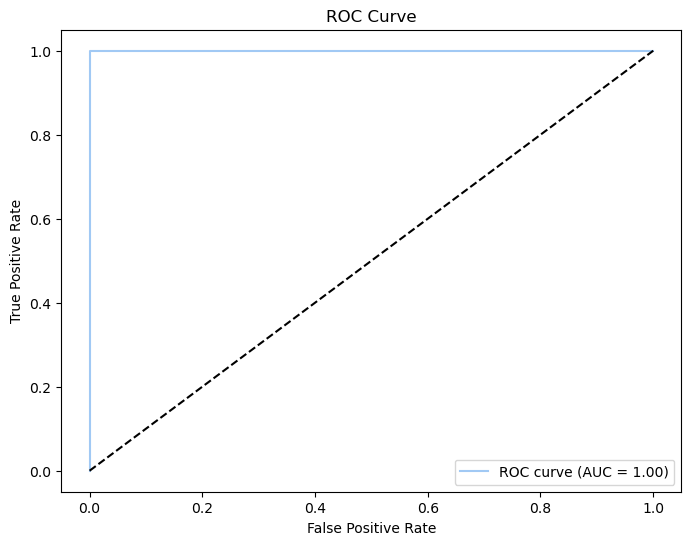

In [78]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Predict on the test set
y_pred_bc = lr1.predict(X_test_bc)
y_pred_proba_bc = lr1.predict_proba(X_test_bc)[:, 1]

# Calculate metrics
accuracy = accuracy_score(y_test_bc, y_pred_bc)
precision = precision_score(y_test_bc, y_pred_bc)
recall = recall_score(y_test_bc, y_pred_bc)
f1 = f1_score(y_test_bc, y_pred_bc)
auc = roc_auc_score(y_test_bc, y_pred_proba_bc)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test_bc, y_pred_proba_bc)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()


In [79]:
lr2 = LogisticRegression(max_iter = 15000, solver = 'sag', C = 100, random_state = 0)
lr2.fit(X_train_bc, y_train_bc)

cv_lr2 = cross_val_score(lr2, X_train_bc, y_train_bc, cv = 5)
print('Logistic regression Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_lr2)))
print(f'\nMean cross-validation score: {cv_lr2.mean():.2f}')

# Predictions
y_pred_bc = lr2.predict(X_test_bc)
y_pred_prob_bc = lr2.predict_proba(X_test_bc)[:, 1]

Logistic regression Model 2

Cross-validation scores: 0.9982222222222222, 0.9982222222222222, 0.9982222222222222, 0.9982222222222222, 1.0

Mean cross-validation score: 1.00


# Comparison between Model 1 & 2
Both lr1 and lr2 show perfect or near-perfect cross-validation scores. This consistency suggests the models are both performing very well. However, the same caution applies:

Overfitting: Both models achieving perfect scores may indicate potential overfitting.
Validation on Unseen Data: Testing on a separate validation or test set not used in cross-validation is crucial.

In [80]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Predictions on the test set
y_pred_bc = lr2.predict(X_test_bc)

# Compute metrics
accuracy = accuracy_score(y_test_bc, y_pred_bc)
precision = precision_score(y_test_bc, y_pred_bc)
recall = recall_score(y_test_bc, y_pred_bc)
f1 = f1_score(y_test_bc, y_pred_bc)
auc = roc_auc_score(y_test_bc, y_pred_bc)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')


Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
AUC: 1.00


In [81]:
print('Logistic Regression Model 2 coefficients:')
print(*lr2.coef_, sep = ', ')
print('\nLogistic Regression Model 2 intercept:', *lr2.intercept_)

Logistic Regression Model 2 coefficients:
[-6.39558269e-01 -1.32080836e-01 -7.26408458e-02  2.22207994e-01
 -5.14087137e-01  2.58779183e-02  4.00423336e-03  7.06892160e-02
 -6.06134927e-02 -5.04063177e-03  9.26168176e-02 -1.91205949e-01
 -4.45685364e-02  7.17912922e-02 -1.17907444e-01  3.09911823e-02
 -1.03020866e-01  1.60524680e-01  4.79646130e-02  3.05778315e-02
  1.16185186e-01  1.01727354e-01  8.09368448e-02 -3.18161768e-02
  7.97924610e-02 -1.00891460e-01  2.48986677e-01 -1.21838947e-01
  2.34903075e-01  3.46462469e-01 -2.53751349e-01 -2.93812802e-03
 -1.78866504e-02 -2.00490221e-04 -3.35340821e-02]

Logistic Regression Model 2 intercept: 4.614311657257182


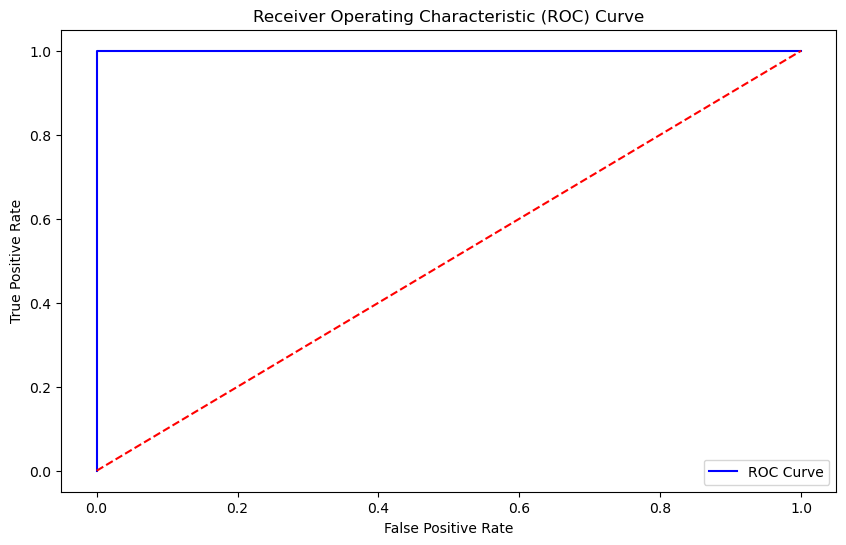

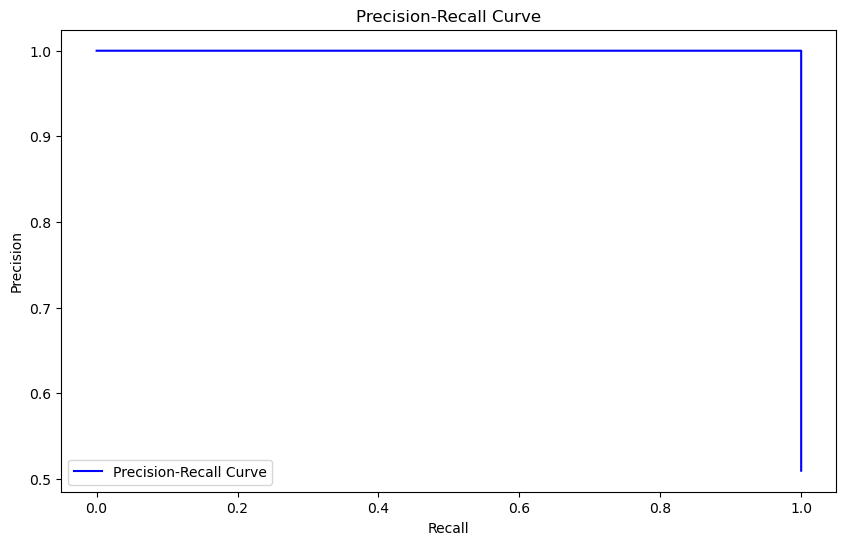

In [82]:
from sklearn.metrics import roc_curve, precision_recall_curve
import matplotlib.pyplot as plt

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_bc, y_pred_prob_bc)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label='ROC Curve')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test_bc, y_pred_prob_bc)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, color='blue', label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()


In [83]:
from sklearn.svm import SVC

svm1 = SVC(kernel = 'poly', C = 1, random_state = 0, probability = True)
svm1.fit(X_train_bc, y_train_bc)

cv_svm1 = cross_val_score(svm1, X_train_bc, y_train_bc, cv = 5)
print('Support Vector Machine Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_svm1)))
print(f'\nMean cross-validation score: {cv_svm1.mean():.2f}')
     

Support Vector Machine Model 1

Cross-validation scores: 0.9884444444444445, 0.9871111111111112, 0.9853333333333333, 0.9897777777777778, 0.9928888888888889

Mean cross-validation score: 0.99


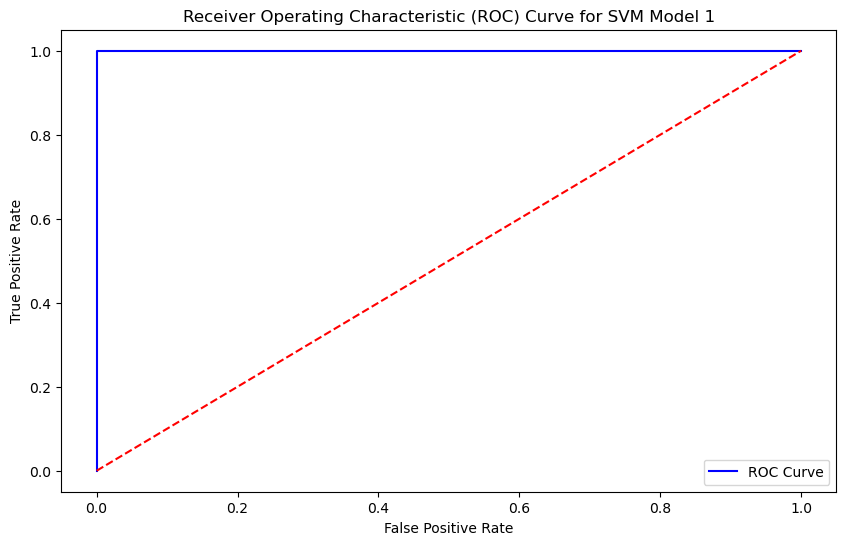

In [84]:
from sklearn.metrics import roc_curve

# Predict probabilities for SVM
y_pred_prob_svm1 = svm1.predict_proba(X_test_bc)[:, 1]

# Compute ROC curve
fpr_svm1, tpr_svm1, _ = roc_curve(y_test_bc, y_pred_prob_svm1)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr_svm1, tpr_svm1, color='blue', label='ROC Curve')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM Model 1')
plt.legend()
plt.show()


In [85]:
svm2 = SVC(kernel = 'rbf', C = 1, gamma = 0.1, random_state = 0, probability = True)
svm2.fit(X_train_bc, y_train_bc)

cv_svm2 = cross_val_score(svm2, X_train_bc, y_train_bc, cv = 5)
print('Support Vector Machine Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_svm2)))
print(f'\nMean cross-validation score: {cv_svm2.mean():.2f}')

Support Vector Machine Model 2

Cross-validation scores: 0.9991111111111111, 0.9986666666666667, 0.9977777777777778, 0.9977777777777778, 0.9991111111111111

Mean cross-validation score: 1.00


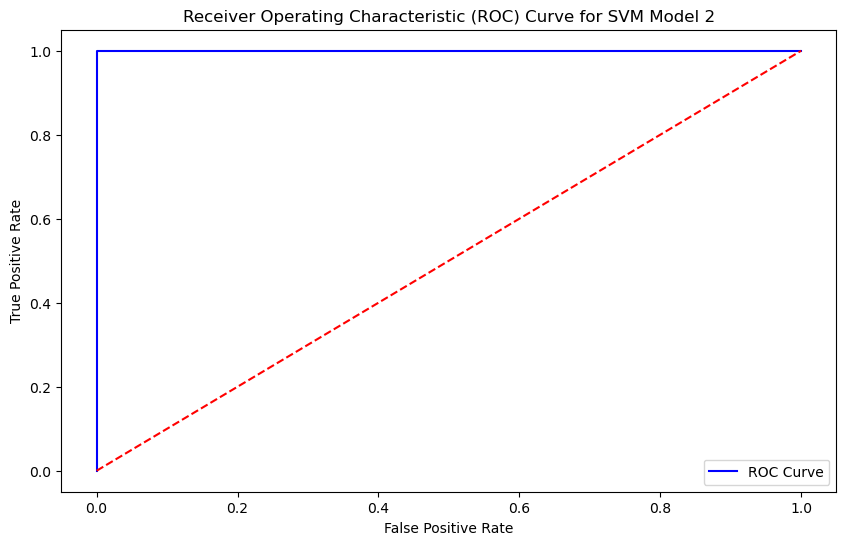

In [86]:

# Predict probabilities for SVM
y_pred_prob_svm2 = svm2.predict_proba(X_test_bc)[:, 1]

# Compute ROC curve
fpr_svm2, tpr_svm2, _ = roc_curve(y_test_bc, y_pred_prob_svm2)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr_svm2, tpr_svm2, color='blue', label='ROC Curve')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM Model 2')
plt.legend()
plt.show()


In [87]:
print('SVM Model 1 intercept:', *svm1.intercept_)
print('SVM Model 2 intercept:', *svm2.intercept_)

SVM Model 1 intercept: 1.0001034568205953
SVM Model 2 intercept: -0.9640006699349671


# Creating a Balanced Dataset for Multi-class Classification


In [88]:
new_data['Attack Type'].value_counts()


Attack Type
UDP        3754680
LDAP       1905191
NetBIOS     202919
Portmap     186960
MSSQL        24392
BENIGN       12992
Name: count, dtype: int64

In [89]:
class_counts = new_data['Attack Type'].value_counts()
selected_classes = class_counts[class_counts > 1500]
class_names = selected_classes.index
selected = new_data[new_data['Attack Type'].isin(class_names)]

dfs = []
for name in class_names:
    df = selected[selected['Attack Type'] == name]
    if len(df) > 5000:
        df = df.sample(n=5000, replace=False, random_state=0)
    dfs.append(df)

df = pd.concat(dfs, ignore_index=True)
df['Attack Type'].value_counts()


Attack Type
UDP        5000
LDAP       5000
NetBIOS    5000
Portmap    5000
MSSQL      5000
BENIGN     5000
Name: count, dtype: int64

In [90]:
import sklearn
import imblearn


from imblearn.over_sampling import SMOTE
import pandas as pd

# Assuming X and y are already defined
X = df.drop('Attack Type', axis=1)
y = df['Attack Type']

# Apply SMOTE to upsample the minority class
smote = SMOTE(sampling_strategy='auto', random_state=0)
X_upsampled, y_upsampled = smote.fit_resample(X, y)

# Create a new dataframe with the upsampled data
blnc_data = pd.DataFrame(X_upsampled)
blnc_data['Attack Type'] = y_upsampled
blnc_data = blnc_data.sample(frac=1, random_state=0)  # Shuffle the dataframe

# Check the class distribution to verify balance
print(blnc_data['Attack Type'].value_counts())


Attack Type
LDAP       5000
NetBIOS    5000
BENIGN     5000
UDP        5000
MSSQL      5000
Portmap    5000
Name: count, dtype: int64


In [91]:
#!pip uninstall scikit-learn --yes

In [92]:
#!pip uninstall imblearn --yes


In [93]:
!pip install imblearn


In [94]:
!pip install scikit-learn==1.2.2


In [102]:
features = blnc_data.drop('Attack Type', axis = 1)
labels = blnc_data['Attack Type']

X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.25, random_state = 0)
print(f"\nTraining set size: {X_train.shape[0]} samples")
print(f"Test set size: {X_test.shape[0]} samples")
     


Training set size: 22500 samples
Test set size: 7500 samples


# Training model

Logistic Regression

Cross-validation scores: 0.7822222222222223, 0.7811111111111111, 0.7848888888888889, 0.8064444444444444, 0.7917777777777778

Mean cross-validation score: 0.79
Logistic Regression Model
Training Time: 153.63 seconds
Testing Time: 0.02 seconds
Accuracy: 0.79
Precision: 0.79
Recall: 0.79
F1 Score: 0.79
AUC: 0.96


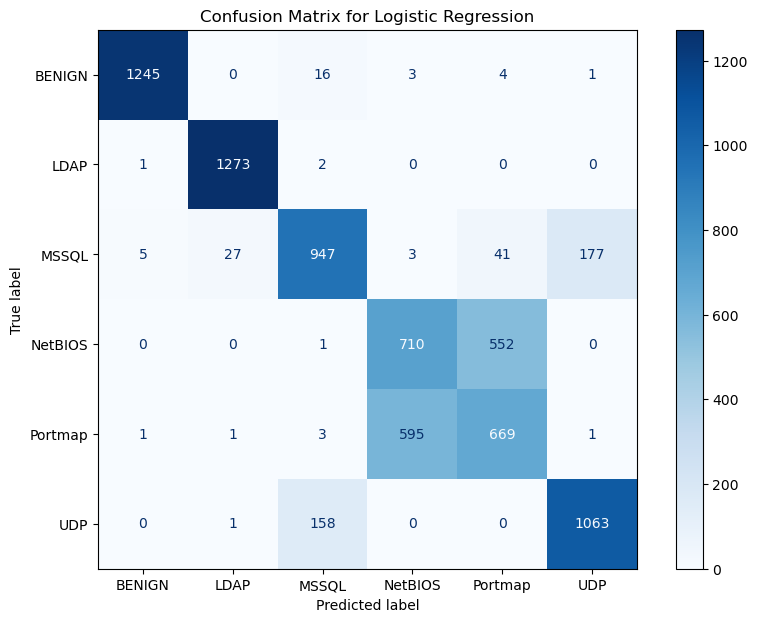


SVM with RBF kernel

Cross-validation scores: 0.8493333333333334, 0.8473333333333334, 0.8515555555555555, 0.8468888888888889, 0.8524444444444444

Mean cross-validation score: 0.85

SVM Model
Training Time: 99.25 seconds
Testing Time: 26.33 seconds
Accuracy: 0.85
Precision: 0.86
Recall: 0.85
F1 Score: 0.84
AUC: 0.97


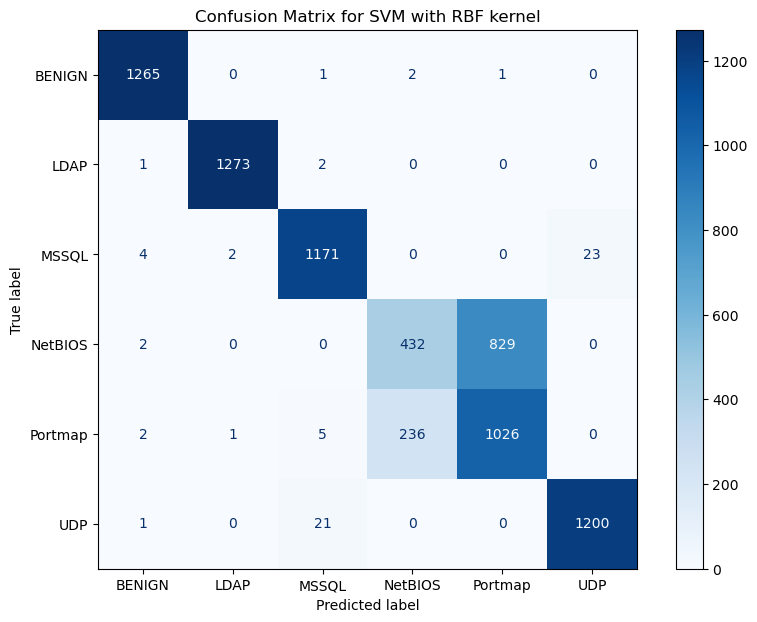

In [96]:
import time
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Logistic Regression
lr = LogisticRegression(max_iter=10000, C=0.1, random_state=0, solver='saga')

# Measure training time for Logistic Regression
start_train_lr = time.time()
lr.fit(X_train, y_train)
end_train_lr = time.time()
train_time_lr = end_train_lr - start_train_lr

# Cross Validation
cv_lr = cross_val_score(lr, X_train, y_train, cv=5)
print('Logistic Regression')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_lr)))
print(f'\nMean cross-validation score: {cv_lr.mean():.2f}')

# Measure testing time for Logistic Regression
start_test_lr = time.time()
y_pred_lr = lr.predict(X_test)
y_pred_prob_lr = lr.predict_proba(X_test)
end_test_lr = time.time()
test_time_lr = end_test_lr - start_test_lr

# Evaluate Logistic Regression
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr, average='weighted')
recall_lr = recall_score(y_test, y_pred_lr, average='weighted')
f1_lr = f1_score(y_test, y_pred_lr, average='weighted')
auc_lr = roc_auc_score(y_test, y_pred_prob_lr, multi_class='ovo')

print('Logistic Regression Model')
print(f'Training Time: {train_time_lr:.2f} seconds')
print(f'Testing Time: {test_time_lr:.2f} seconds')
print(f'Accuracy: {accuracy_lr:.2f}')
print(f'Precision: {precision_lr:.2f}')
print(f'Recall: {recall_lr:.2f}')
print(f'F1 Score: {f1_lr:.2f}')
print(f'AUC: {auc_lr:.2f}')

# Compute confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr, labels=lr.classes_)

# Create Confusion Matrix Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=lr.classes_)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 7))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()


# SVM with RBF kernel
svm = SVC(kernel='rbf', C=1, gamma=0.1, random_state=0, probability=True)

# Measure training time for SVM
start_train_svm = time.time()
svm.fit(X_train, y_train)
end_train_svm = time.time()
train_time_svm = end_train_svm - start_train_svm

# Cross Validation
cv_svm = cross_val_score(svm, X_train, y_train, cv=5)
print('\nSVM with RBF kernel')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_svm)))
print(f'\nMean cross-validation score: {cv_svm.mean():.2f}')

# Measure testing time for SVM
start_test_svm = time.time()
y_pred_svm = svm.predict(X_test)
y_pred_prob_svm = svm.predict_proba(X_test)
end_test_svm = time.time()
test_time_svm = end_test_svm - start_test_svm

# Evaluate SVM
accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm, average='weighted')
recall_svm = recall_score(y_test, y_pred_svm, average='weighted')
f1_svm = f1_score(y_test, y_pred_svm, average='weighted')
auc_svm = roc_auc_score(y_test, y_pred_prob_svm, multi_class='ovo')

print('\nSVM Model')
print(f'Training Time: {train_time_svm:.2f} seconds')
print(f'Testing Time: {test_time_svm:.2f} seconds')
print(f'Accuracy: {accuracy_svm:.2f}')
print(f'Precision: {precision_svm:.2f}')
print(f'Recall: {recall_svm:.2f}')
print(f'F1 Score: {f1_svm:.2f}')
print(f'AUC: {auc_svm:.2f}')

# Compute confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm, labels=svm.classes_)

# Create Confusion Matrix Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=svm.classes_)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 7))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for SVM with RBF kernel')
plt.show()


# Random Forest Classifier

Random Forest Model 1

Cross-validation scores: 0.8331111111111111, 0.8295555555555556, 0.8344444444444444, 0.8333333333333334, 0.8244444444444444

Mean cross-validation score: 0.83
Random Forest Model 1
Accuracy: 0.83
Precision: 0.84
Recall: 0.83
F1 Score: 0.81
AUC: 0.97


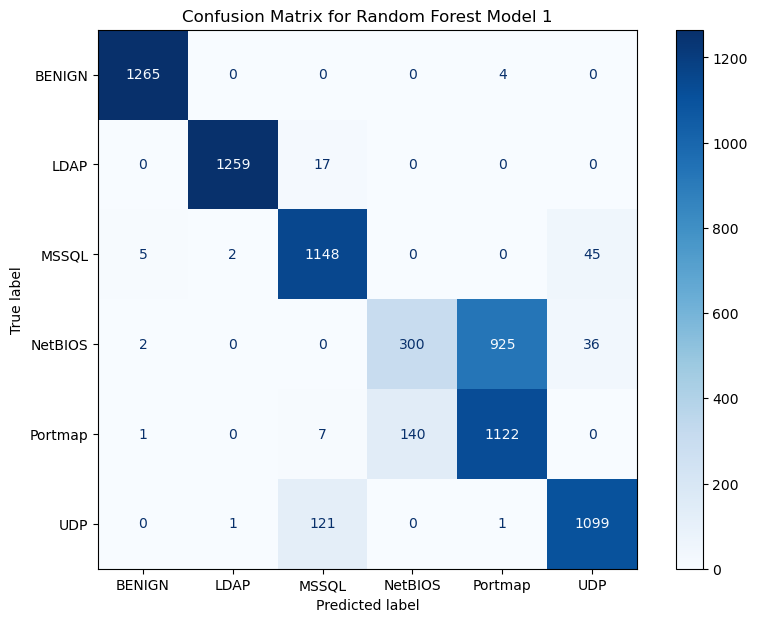

Random Forest Model 2

Cross-validation scores: 0.8493333333333334, 0.8488888888888889, 0.8495555555555555, 0.8488888888888889, 0.8564444444444445

Mean cross-validation score: 0.85

 
Random Forest Model 2
Accuracy: 0.85
Precision: 0.86
Recall: 0.85
F1 Score: 0.83
AUC: 0.97


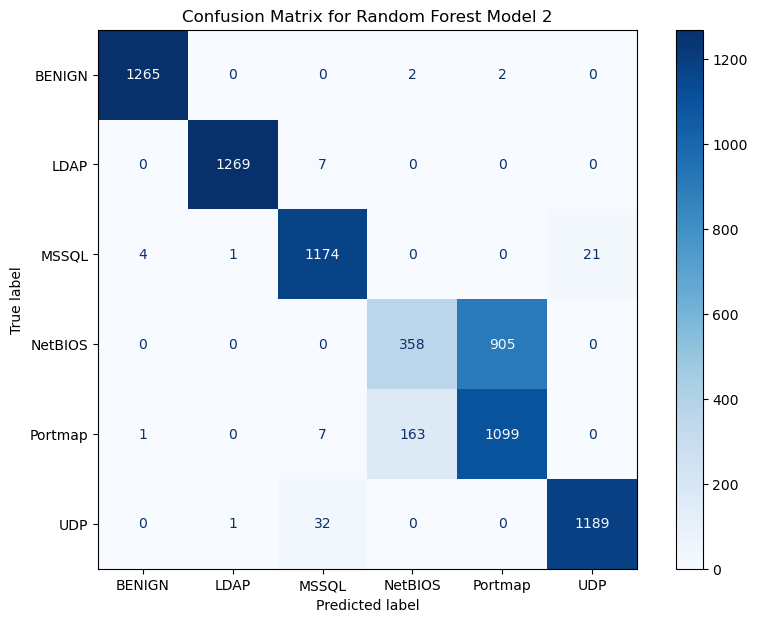

In [97]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay


# Random Forest Model 1
rf1 = RandomForestClassifier(n_estimators=10, max_depth=6, max_features=None, random_state=0)
rf1.fit(X_train, y_train)

cv_rf1 = cross_val_score(rf1, X_train, y_train, cv=5)
print('Random Forest Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_rf1)))
print(f'\nMean cross-validation score: {cv_rf1.mean():.2f}')

y_pred_rf1 = rf1.predict(X_test)
y_pred_prob_rf1 = rf1.predict_proba(X_test)

accuracy_rf1 = accuracy_score(y_test, y_pred_rf1)
precision_rf1 = precision_score(y_test, y_pred_rf1, average='weighted')
recall_rf1 = recall_score(y_test, y_pred_rf1, average='weighted')
f1_rf1 = f1_score(y_test, y_pred_rf1, average='weighted')
auc_rf1 = roc_auc_score(y_test, y_pred_prob_rf1, multi_class='ovo', average='weighted')

print('Random Forest Model 1')
print(f'Accuracy: {accuracy_rf1:.2f}')
print(f'Precision: {precision_rf1:.2f}')
print(f'Recall: {recall_rf1:.2f}')
print(f'F1 Score: {f1_rf1:.2f}')
print(f'AUC: {auc_rf1:.2f}')

# Compute confusion matrix
cm_rf1 = confusion_matrix(y_test, y_pred_rf1, labels=rf1.classes_)

# Create Confusion Matrix Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_rf1, display_labels=rf1.classes_)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 7))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for Random Forest Model 1')
plt.show()

# Random Forest Model 2
rf2 = RandomForestClassifier(n_estimators=15, max_depth=8, max_features=20, random_state=0)
rf2.fit(X_train, y_train)

cv_rf2 = cross_val_score(rf2, X_train, y_train, cv=5)
print('Random Forest Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_rf2)))
print(f'\nMean cross-validation score: {cv_rf2.mean():.2f}')

y_pred_rf2 = rf2.predict(X_test)
y_pred_prob_rf2 = rf2.predict_proba(X_test)

accuracy_rf2 = accuracy_score(y_test, y_pred_rf2)
precision_rf2 = precision_score(y_test, y_pred_rf2, average='weighted')
recall_rf2 = recall_score(y_test, y_pred_rf2, average='weighted')
f1_rf2 = f1_score(y_test, y_pred_rf2, average='weighted')
auc_rf2 = roc_auc_score(y_test, y_pred_prob_rf2, multi_class='ovo', average='weighted')

print('\n \nRandom Forest Model 2')
print(f'Accuracy: {accuracy_rf2:.2f}')
print(f'Precision: {precision_rf2:.2f}')
print(f'Recall: {recall_rf2:.2f}')
print(f'F1 Score: {f1_rf2:.2f}')
print(f'AUC: {auc_rf2:.2f}')


# Compute confusion matrix
cm_rf2 = confusion_matrix(y_test, y_pred_rf2, labels=rf2.classes_)

# Create Confusion Matrix Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_rf2, display_labels=rf2.classes_)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 7))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for Random Forest Model 2')
plt.show()

Random Forest Model

Cross-validation scores: 0.8313333333333334, 0.828, 0.8342222222222222, 0.8322222222222222, 0.8368888888888889

Mean cross-validation score: 0.83
Random Forest Model 1
Training Time: 58.74 seconds
Testing Time: 0.14 seconds
Accuracy: 0.83
Precision: 0.84
Recall: 0.83
F1 Score: 0.81
AUC: 0.97


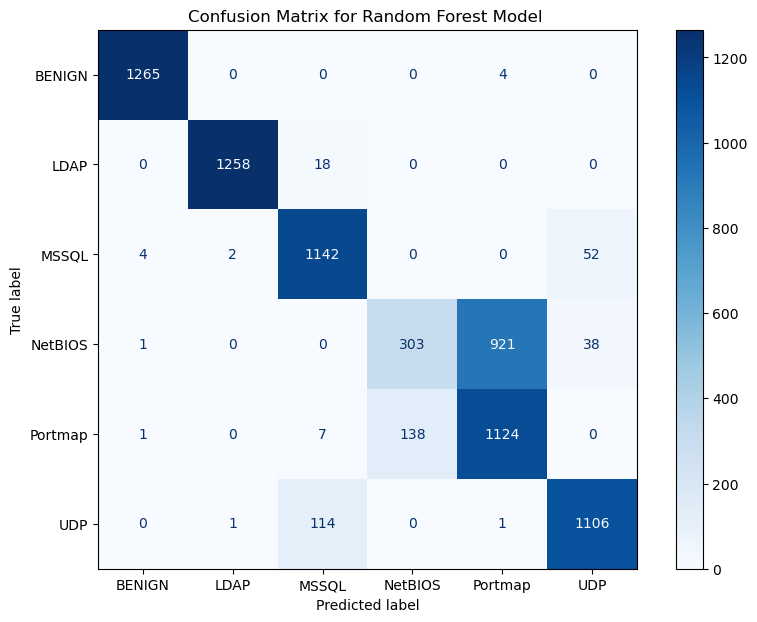

In [104]:
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score

# Random Forest Model 1
rf1 = RandomForestClassifier(n_estimators=100, max_depth=6, max_features=None, random_state=0)

# Measure training time for Random Forest Model 1
start_train_rf1 = time.time()
rf1.fit(X_train, y_train)
end_train_rf1 = time.time()
train_time_rf1 = end_train_rf1 - start_train_rf1

# Cross-validation
cv_rf1 = cross_val_score(rf1, X_train, y_train, cv=5)
print('Random Forest Model')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_rf1)))
print(f'\nMean cross-validation score: {cv_rf1.mean():.2f}')

# Measure testing time for Random Forest Model 1
start_test_rf1 = time.time()
y_pred_rf1 = rf1.predict(X_test)
y_pred_prob_rf1 = rf1.predict_proba(X_test)
end_test_rf1 = time.time()
test_time_rf1 = end_test_rf1 - start_test_rf1

# Evaluate Random Forest Model 1
accuracy_rf1 = accuracy_score(y_test, y_pred_rf1)
precision_rf1 = precision_score(y_test, y_pred_rf1, average='weighted')
recall_rf1 = recall_score(y_test, y_pred_rf1, average='weighted')
f1_rf1 = f1_score(y_test, y_pred_rf1, average='weighted')
auc_rf1 = roc_auc_score(y_test, y_pred_prob_rf1, multi_class='ovo', average='weighted')

print('Random Forest Model 1')
print(f'Training Time: {train_time_rf1:.2f} seconds')
print(f'Testing Time: {test_time_rf1:.2f} seconds')
print(f'Accuracy: {accuracy_rf1:.2f}')
print(f'Precision: {precision_rf1:.2f}')
print(f'Recall: {recall_rf1:.2f}')
print(f'F1 Score: {f1_rf1:.2f}')
print(f'AUC: {auc_rf1:.2f}')

# Compute confusion matrix
cm_rf1 = confusion_matrix(y_test, y_pred_rf1, labels=rf1.classes_)

# Create Confusion Matrix Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm_rf1, display_labels=rf1.classes_)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 7))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for Random Forest Model ')
plt.show()


# Random Forest Model 2
rf2 = RandomForestClassifier(n_estimators=15, max_depth=8, max_features=20, random_state=0)

# Measure training time for Random Forest Model 2
start_train_rf2 = time.time()
rf2.fit(X_train, y_train)
end_train_rf2 = time.time()
train_time_rf2 = end_train_rf2 - start_train_rf2



# Bar Chat

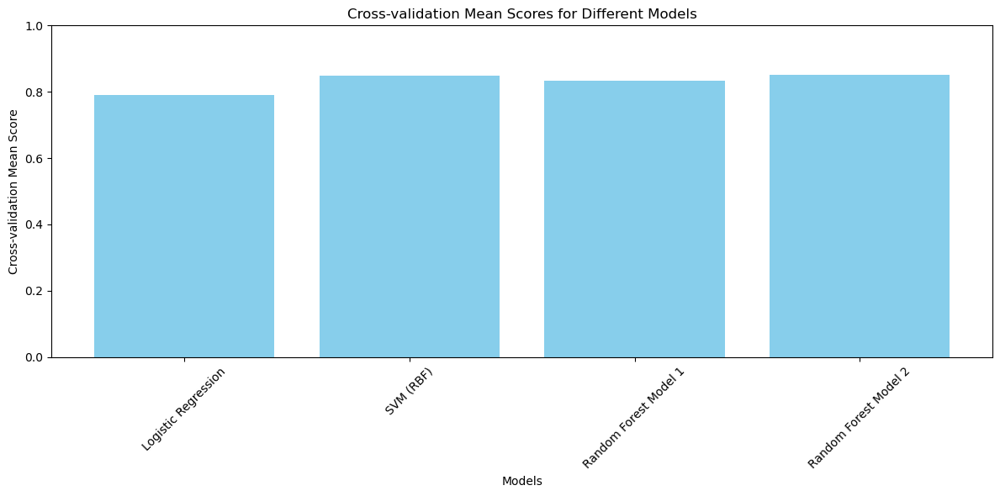

C:\Users\rupal\AppData\Local\Temp\ipykernel_18728\1507428900.py:38: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


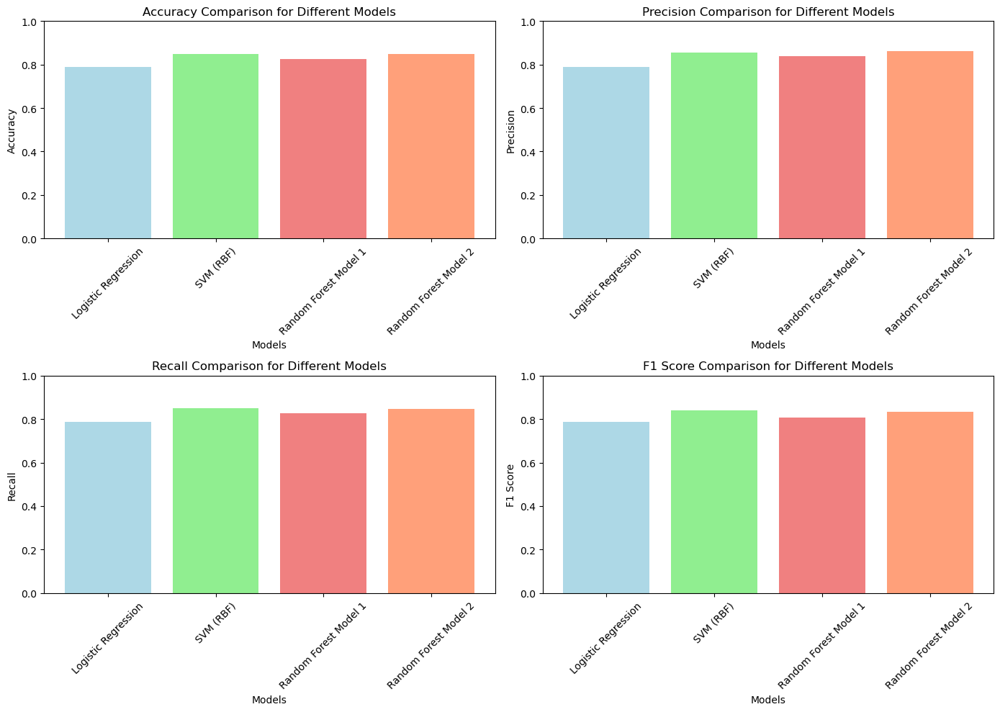

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define models and their corresponding metrics
models = ['Logistic Regression', 'SVM (RBF)', 'Random Forest Model 1', 'Random Forest Model 2']
cv_scores = [cv_lr.mean(), cv_svm.mean(), cv_rf1.mean(), cv_rf2.mean()]
accuracy_scores = [accuracy_lr, accuracy_svm, accuracy_rf1, accuracy_rf2]
precision_scores = [precision_lr, precision_svm, precision_rf1, precision_rf2]
recall_scores = [recall_lr, recall_svm, recall_rf1, recall_rf2]
f1_scores = [f1_lr, f1_svm, f1_rf1, f1_rf2]

# Plotting cross-validation scores
plt.figure(figsize=(12, 6))
plt.bar(models, cv_scores, color='skyblue')
plt.xlabel('Models')
plt.ylabel('Cross-validation Mean Score')
plt.title('Cross-validation Mean Scores for Different Models')
plt.ylim([0, 1])
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plotting accuracy, precision, recall, and F1 score
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
scores = [accuracy_scores, precision_scores, recall_scores, f1_scores]

plt.figure(figsize=(14, 10))

for i, metric in enumerate(metrics, start=1):
    plt.subplot(2, 2, i)
    plt.bar(models, scores[i-1], color=['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon'])
    plt.xlabel('Models')
    plt.ylabel(metric)
    plt.title(f'{metric} Comparison for Different Models')
    plt.ylim([0, 1])
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()


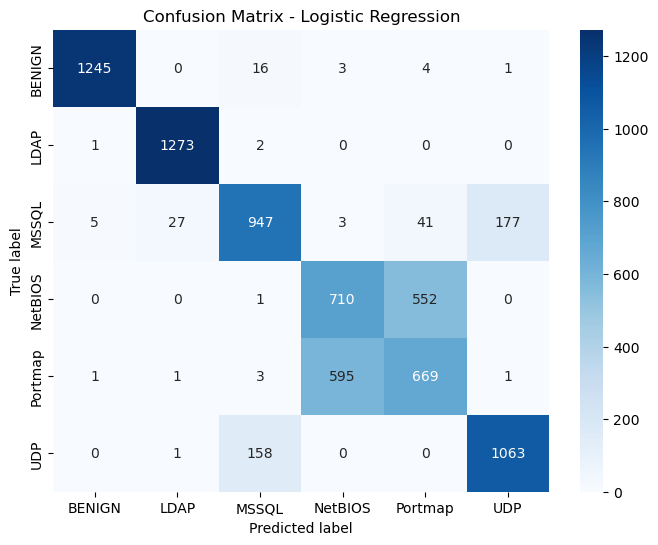

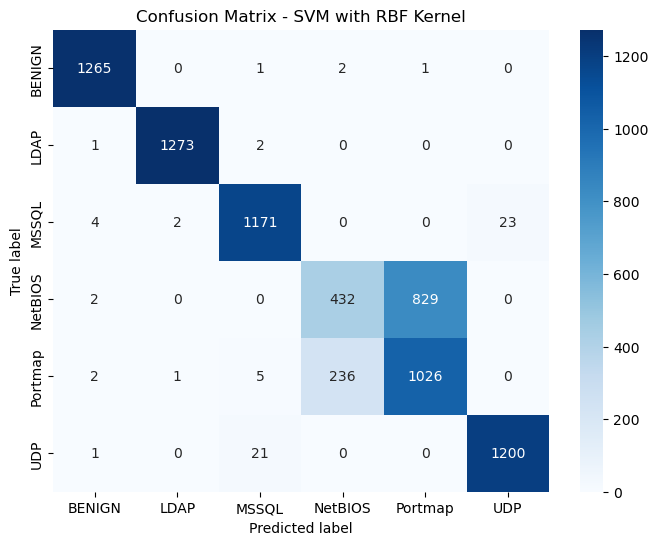

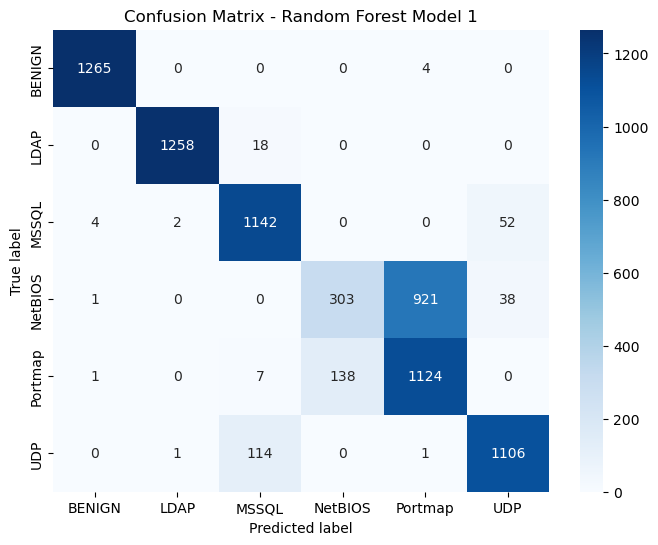

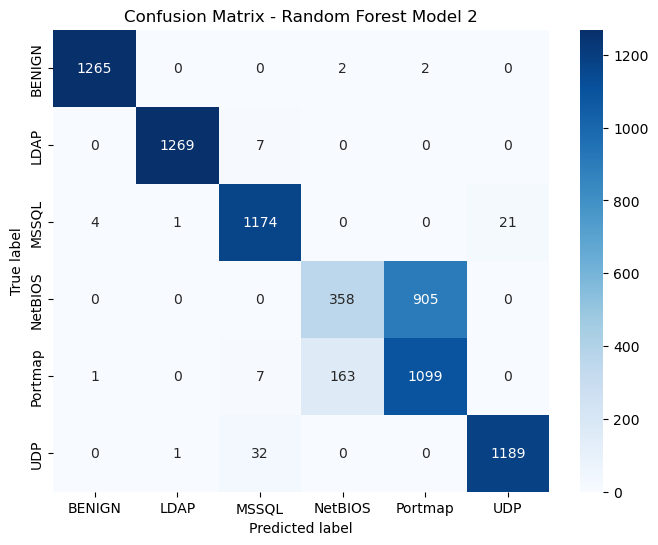

In [100]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Define function to plot confusion matrix
def plot_confusion_matrix(cm, classes, title, cmap=plt.cm.Blues):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, cmap=cmap, fmt='d', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()

# Define classes based on your specific dataset
classes = ['BENIGN','LDAP','MSSQL','NetBIOS','Portmap','UDP']  # Replace with actual class labels

# Confusion Matrix for Logistic Regression
cm_lr = confusion_matrix(y_test, y_pred_lr)
plot_confusion_matrix(cm_lr, classes, title='Confusion Matrix - Logistic Regression')

# Confusion Matrix for SVM
cm_svm = confusion_matrix(y_test, y_pred_svm)
plot_confusion_matrix(cm_svm, classes, title='Confusion Matrix - SVM with RBF Kernel')

# Confusion Matrix for Random Forest Model 1
cm_rf1 = confusion_matrix(y_test, y_pred_rf1)
plot_confusion_matrix(cm_rf1, classes, title='Confusion Matrix - Random Forest Model 1')

# Confusion Matrix for Random Forest Model 2
cm_rf2 = confusion_matrix(y_test, y_pred_rf2)
plot_confusion_matrix(cm_rf2, classes, title='Confusion Matrix - Random Forest Model 2')


# KNN Classifier



K-Nearest Neighbors

Cross-validation scores: 0.8368888888888889, 0.8324444444444444, 0.836, 0.8351111111111111, 0.8348888888888889

Mean cross-validation score: 0.84

K-Nearest Neighbors Model
Training Time: 0.03 seconds
Testing Time: 3.38 seconds
Accuracy: 0.84
Precision: 0.84
Recall: 0.84
F1 Score: 0.84
AUC: 0.97


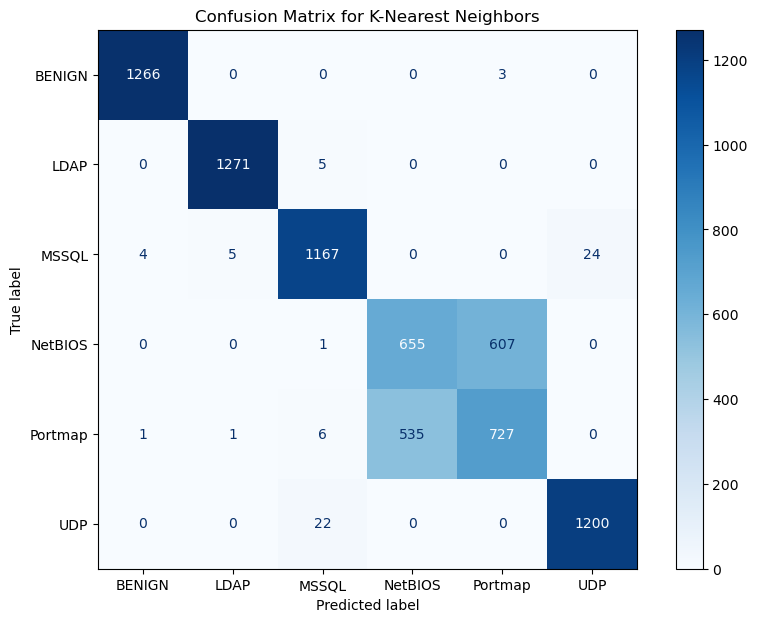

In [101]:
import time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt

# Initialize K-Nearest Neighbors model
knn = KNeighborsClassifier(n_neighbors=5)

# Measure training time for K-Nearest Neighbors
start_train_knn = time.time()
knn.fit(X_train, y_train)
end_train_knn = time.time()
train_time_knn = end_train_knn - start_train_knn

# Cross Validation for KNN
cv_knn = cross_val_score(knn, X_train, y_train, cv=5)
print('\nK-Nearest Neighbors')
print(f'\nCross-validation scores: {", ".join(map(str, cv_knn))}')
print(f'\nMean cross-validation score: {cv_knn.mean():.2f}')

# Measure testing time for K-Nearest Neighbors
start_test_knn = time.time()
y_pred_knn = knn.predict(X_test)
y_pred_prob_knn = knn.predict_proba(X_test)
end_test_knn = time.time()
test_time_knn = end_test_knn - start_test_knn

# Evaluate KNN
accuracy_knn = accuracy_score(y_test, y_pred_knn)
precision_knn = precision_score(y_test, y_pred_knn, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn, average='weighted')
f1_knn = f1_score(y_test, y_pred_knn, average='weighted')
auc_knn = roc_auc_score(y_test, y_pred_prob_knn, multi_class='ovo')

print('\nK-Nearest Neighbors Model')
print(f'Training Time: {train_time_knn:.2f} seconds')
print(f'Testing Time: {test_time_knn:.2f} seconds')
print(f'Accuracy: {accuracy_knn:.2f}')
print(f'Precision: {precision_knn:.2f}')
print(f'Recall: {recall_knn:.2f}')
print(f'F1 Score: {f1_knn:.2f}')
print(f'AUC: {auc_knn:.2f}')

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_knn, labels=knn.classes_)

# Create Confusion Matrix Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(10, 7))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for K-Nearest Neighbors')
plt.show()
